<a href="https://colab.research.google.com/github/cuzmyk/machine_learning/blob/main/2s_4pr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Практическая работа №4. Построение сверточной нейронной сети для классификации изображений, с использованием BatchNormalization() и Dropout()

[Код с пары](https://colab.research.google.com/drive/1cvPrPI09ySQy-D92gKTzmanVi2cj5Gw_?usp=sharing)

## Задание 1. Построение сверточной нейронной сети для классификации изображений из датасета CIFAR-100, с использованием BatchNormalization() и Dropout():

### 1.1. Загрузите исходный датасет. Разделите его на обучающую и тестовую выборки:

*P.S.: Не забудьте обратить внимание на размерность (shape) исходных данных и при необходимости измените её (см. примеры из предыдущих занятий)*

[Информация о датасете в Kaggle](https://www.kaggle.com/datasets/fedesoriano/cifar100?resource=download&select=meta)

[Техническая документация по использованию датасета в Keras](https://keras.io/api/datasets/cifar100/)





In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import warnings
from pylab import rcParams
import keras
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.optimizers import Adam

In [88]:
import keras
from keras.datasets import cifar100

(X_train, y_train), (X_test, y_test) = keras.datasets.cifar100.load_data(label_mode="coarse")
assert X_train.shape == (50000, 32, 32, 3)
assert X_test.shape == (10000, 32, 32, 3)
assert y_train.shape == (50000, 1)
assert y_test.shape == (10000, 1)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3), (50000, 1), (10000, 1))

### 1.2. Визуализируйте несколько изображений из датасета:


In [89]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_images(images, labels, class_names=None, num_images=10):
    # Выбираем случайные индексы для отображения
    indices = np.random.choice(len(images), num_images, replace=False)

    # Создаем сетку для отображения изображений
    plt.figure(figsize=(15, 3))
    for i, idx in enumerate(indices):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(images[idx])
        plt.axis('off')

    plt.tight_layout()
    plt.show()

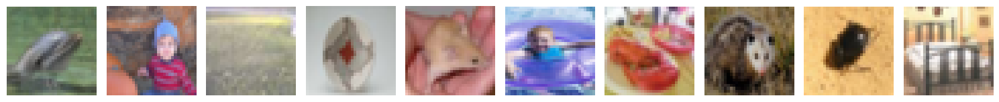

In [90]:
visualize_images(x_train, y_train, num_images=10)

### 1.3. Произведите нормализацию данных:

In [91]:
X_train = X_train / 255.0
X_test = X_test / 255.0

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3), (50000, 20), (10000, 20))

### 1.4. Создайте модель сверточной нейронной сети для решения поставленной задачи без использования BatchNormalization() и Dropout():

Имя данной модели: model_1

In [92]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Dense, Flatten
from keras.optimizers import Adam, SGD

model_1 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='leaky_relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
    MaxPooling2D((2, 2), strides=2),
    Flatten(),
    Dense(128, activation='leaky_relu'),
    Dense(20, activation='softmax')
])

model_1.summary()

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_63 (Conv2D)                   │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_51 (MaxPooling2D)      │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_64 (Conv2D)                   │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_24 (Flatten)                 │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_49 (Dense)                     │ (None, 128)                 │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_50 (Dense)                     │ (None, 20)                  │           2,580 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 546,388 (2.08 MB)

 Trainable params: 546,388 (2.08 MB)

 Non-trainable params: 0 (0.00 B)

In [93]:
EPOCHS = 50

model_1.compile(optimizer='adam',
             loss='categorical_crossentropy',
             metrics=['accuracy'])

In [94]:
# добавляем коллбэки
from keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath="best_model_4_1.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0) # Сохранение модели
                                         # только при улучшении
                                         # валидационной точности

Обучите созданную модель

In [95]:
model_1_history = model_1.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              epochs=EPOCHS,
                              batch_size=256,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.1988 - loss: 2.6114 - val_accuracy: 0.3438 - val_loss: 2.1263
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3791 - loss: 2.0445 - val_accuracy: 0.3955 - val_loss: 1.9451
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.4391 - loss: 1.8294 - val_accuracy: 0.4523 - val_loss: 1.7987
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4763 - loss: 1.6929 - val_accuracy: 0.4660 - val_loss: 1.7344
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.5157 - loss: 1.5766 - val_accuracy: 0.4899 - val_loss: 1.6701
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5440 - loss: 1.4817 - val_accuracy: 0.4927 - val_loss: 1.6540
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5697 - loss: 1.3926 - val_accuracy: 0.5042 - val_loss: 1.6130
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.5929 - loss: 1.3056 - val_accura

In [96]:
from keras.models import load_model

model_1 = load_model("/content/best_model_4_1.keras")

### 1.5. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием BatchNormalization():

Имя данной модели: model_2

In [10]:
model_2 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(128, (3,3), padding='same', activation='relu'),
    Flatten(),
    Dense(128),
    BatchNormalization(),
    Activation("relu"),
    Dense(20),
    BatchNormalization(),
    Activation("softmax")
])

model_2.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath="best_model_4_2.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0)

Обучите созданную модель

In [12]:
model_2_history = model_2.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=256,
                              epochs=EPOCHS,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - accuracy: 0.2820 - loss: 2.4004 - val_accuracy: 0.2676 - val_loss: 2.5820
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.4845 - loss: 1.7543 - val_accuracy: 0.4204 - val_loss: 1.9964
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5665 - loss: 1.4893 - val_accuracy: 0.4634 - val_loss: 1.7757
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6414 - loss: 1.2523 - val_accuracy: 0.4539 - val_loss: 1.8007
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7107 - loss: 1.0408 - val_accuracy: 0.4633 - val_loss: 1.8261
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7932 - loss: 0.8068 - val_accuracy: 0.5213 - val_loss: 1.6256
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8683 - loss: 0.5981 - val_accuracy: 0.5204 - val_loss: 1.6923
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9241 - loss: 0.4257 - val_acc

In [13]:
from keras.models import load_model

model_2 = load_model("/content/best_model_4_2.keras")

### 1.6. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием Dropout():

Имя данной модели: model_3

In [14]:
model_3 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='leaky_relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
    MaxPooling2D((2, 2), strides=2),
    Dropout(0.5),
    Flatten(),
    Dense(128),
    Activation("leaky_relu"),
    Dense(20),
    Activation("softmax")
])

model_3.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath="best_model_4_3.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0)

Обучите созданную модель

In [16]:
model_3_history = model_3.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=256,
                              epochs=EPOCHS,
                              verbose=1,
                              callbacks=[checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - accuracy: 0.0982 - loss: 2.8695 - val_accuracy: 0.2453 - val_loss: 2.4361
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.2539 - loss: 2.4133 - val_accuracy: 0.3156 - val_loss: 2.2188
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.3023 - loss: 2.2466 - val_accuracy: 0.3280 - val_loss: 2.1715
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3325 - loss: 2.1522 - val_accuracy: 0.3661 - val_loss: 2.0349
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3509 - loss: 2.0754 - val_accuracy: 0.3828 - val_loss: 1.9872
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3712 - loss: 2.0238 - val_accuracy: 0.3932 - val_loss: 1.9408
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.3835 - loss: 1.9841 - val_accuracy: 0.3883 - val_loss: 1.9688
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3965 - loss: 1.9359 - val_accuracy

In [58]:
from keras.models import load_model

model_3 = load_model("/content/best_model_4_3.keras")

### 1.7. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием Dropout() и BatchNormalization().

См. рекомендации [здесь](https://stackoverflow.com/questions/39691902/ordering-of-batch-normalization-and-dropout) и [здесь](https://www.kaggle.com/code/ryanholbrook/dropout-and-batch-normalization/)

Имя данной модели: model_4

In [126]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Activation, LeakyReLU, Input
from keras.callbacks import EarlyStopping, ModelCheckpoint

model_4 = Sequential([
    Conv2D(32, (3,3), padding='same', input_shape=(32, 32, 3)),
    LeakyReLU(alpha=0.1),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same'),
    LeakyReLU(alpha=0.1),
    MaxPooling2D((2, 2), strides=2),
    Dropout(0.5),
    Flatten(),
    Dense(128),
    BatchNormalization(),
    LeakyReLU(alpha=0.1),
    Dense(20),
    BatchNormalization(),
    Activation("softmax")
])

model_4.compile(loss='categorical_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])

In [127]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint(filepath="best_model_4_4.keras",
                             monitor="val_accuracy",
                             save_best_only=True,
                             verbose=0)

Обучите созданную модель

In [128]:
model_4_history = model_4.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=256,
                              epochs=50,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - accuracy: 0.2369 - loss: 2.5513 - val_accuracy: 0.3052 - val_loss: 2.5740
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.4114 - loss: 1.9784 - val_accuracy: 0.4384 - val_loss: 2.0224
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4785 - loss: 1.7600 - val_accuracy: 0.4834 - val_loss: 1.7491
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.5140 - loss: 1.6334 - val_accuracy: 0.4802 - val_loss: 1.7117
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5401 - loss: 1.5233 - val_accuracy: 0.5161 - val_loss: 1.5786
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5646 - loss: 1.4395 - val_accuracy: 0.5240 - val_loss: 1.5479
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5883 - loss: 1.3605 - val_accuracy: 0.5405 - val_loss: 1.5085
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5979 - loss: 1.3009 - val_acc

In [129]:
from keras.models import load_model

model_4 = load_model("/content/best_model_4_4.keras")

### Задание 1.8. Пойстройте график обучения для каждой модели. Сделайте выводы по каждому из них. Подведите итог и выделите наиболее удачную модель:

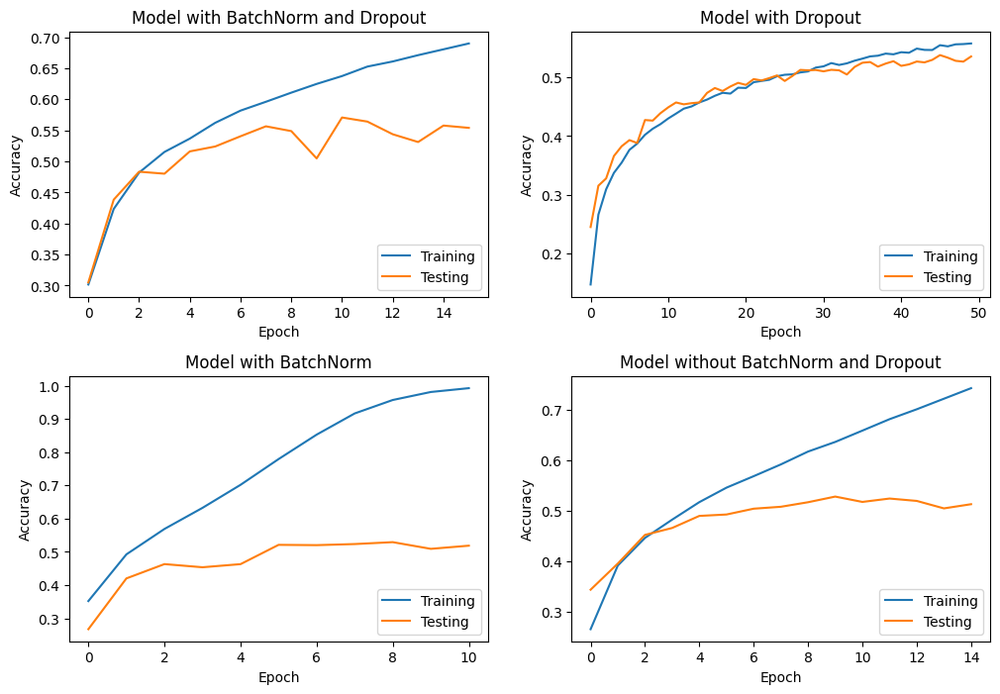

In [130]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(model_4_history.history['accuracy'], label='Training')
plt.plot(model_4_history.history['val_accuracy'], label='Testing')
plt.title('Model with BatchNorm and Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplot(2, 2, 2)
plt.plot(model_3_history.history['accuracy'], label='Training')
plt.plot(model_3_history.history['val_accuracy'], label='Testing')
plt.title('Model with Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplot(2, 2, 3)
plt.plot(model_2_history.history['accuracy'], label='Training')
plt.plot(model_2_history.history['val_accuracy'], label='Testing')
plt.title('Model with BatchNorm')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplot(2, 2, 4)
plt.plot(model_1_history.history['accuracy'], label='Training')
plt.plot(model_1_history.history['val_accuracy'], label='Testing')
plt.title('Model without BatchNorm and Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplots_adjust(hspace=0.3)

plt.show()

Ваши выводы: все модели кроме той, где использовался только Dropuot, обучились посредственно

Ваш итог: наиболее удачная модель - Dropout

### 1.9. Визуализируйте карты активации модели с BatchNorm() и Dropout(),отдельно по каждому классу:


=== Класс 0 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


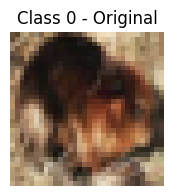

Слой 0: conv2d_75 ((1, 32, 32, 32))


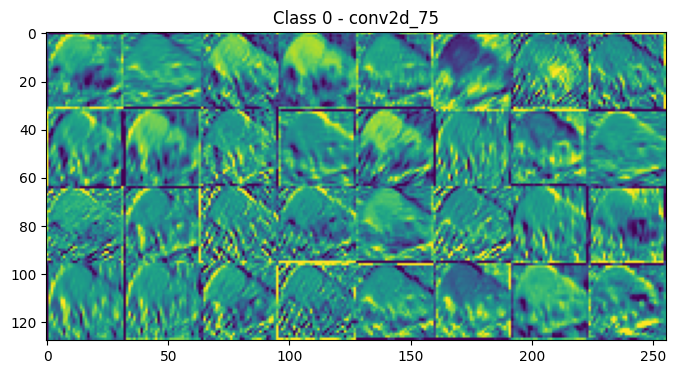

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


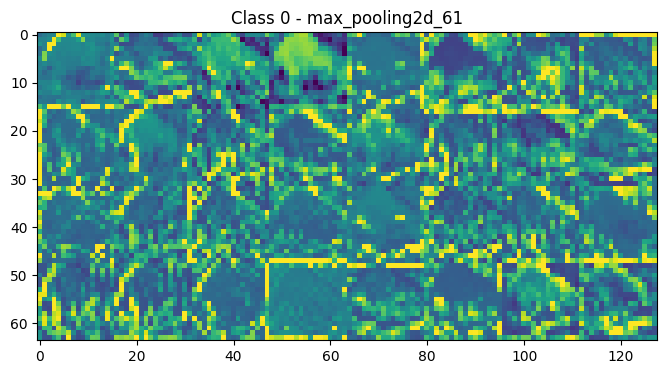

Слой 2: conv2d_76 ((1, 16, 16, 64))


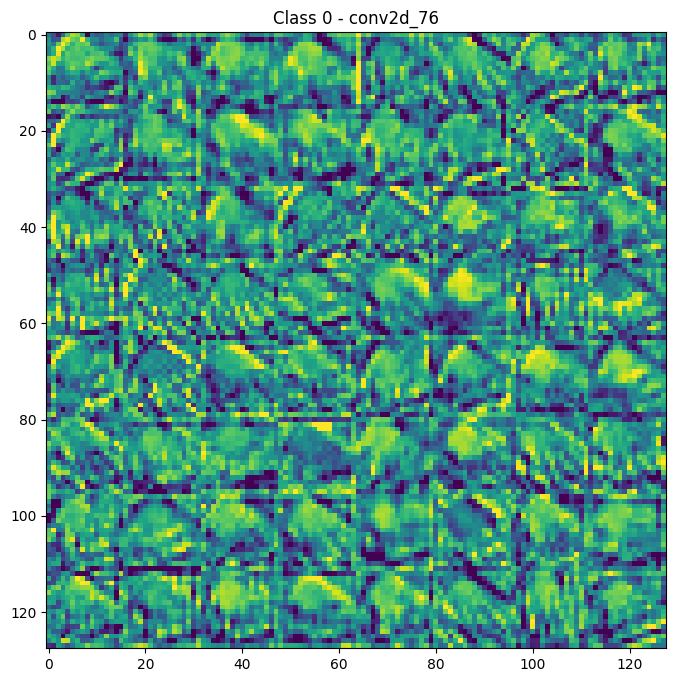

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


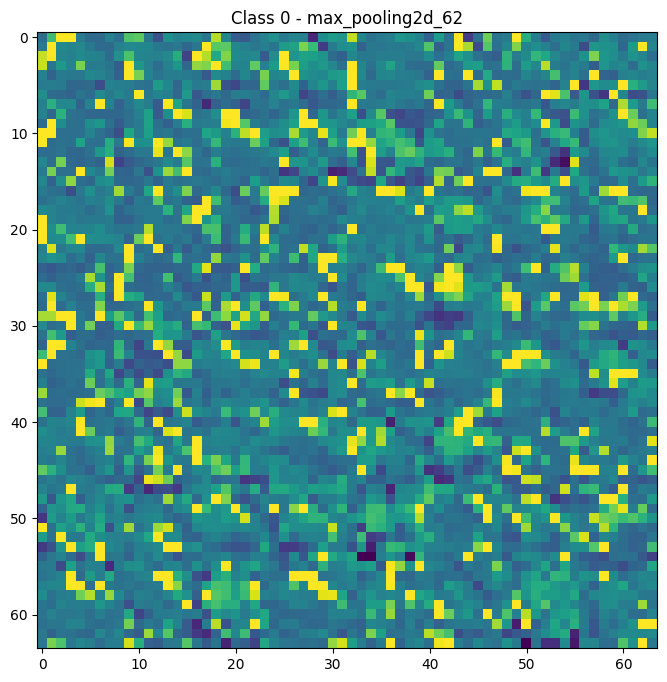

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 1 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


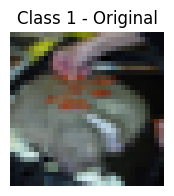

Слой 0: conv2d_75 ((1, 32, 32, 32))


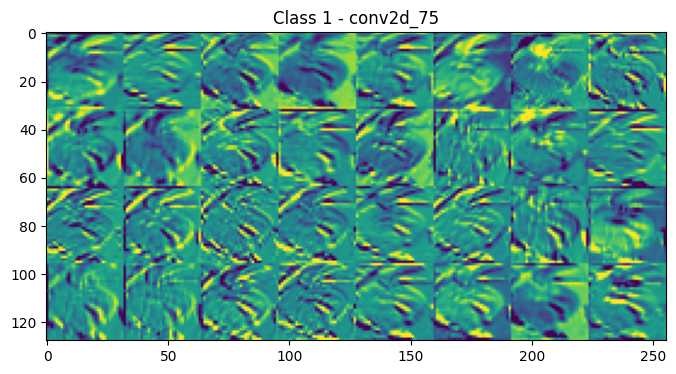

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


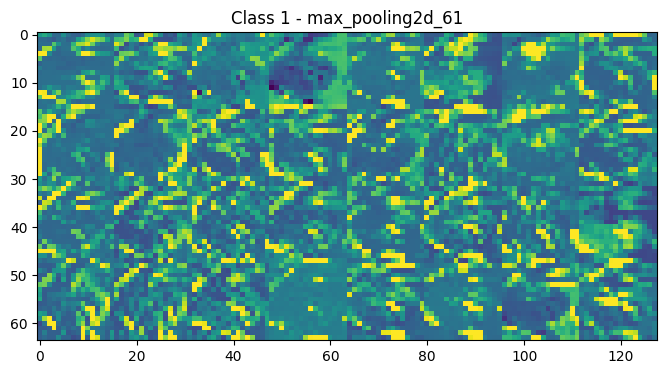

Слой 2: conv2d_76 ((1, 16, 16, 64))


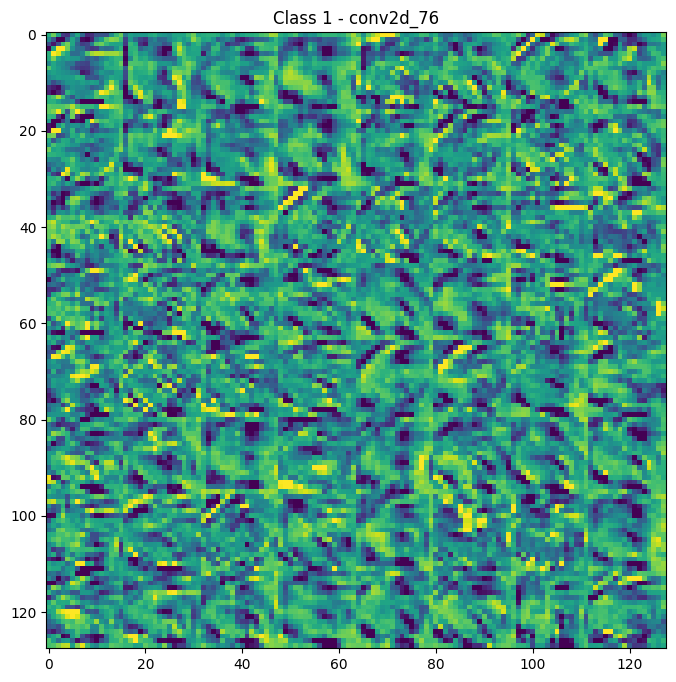

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


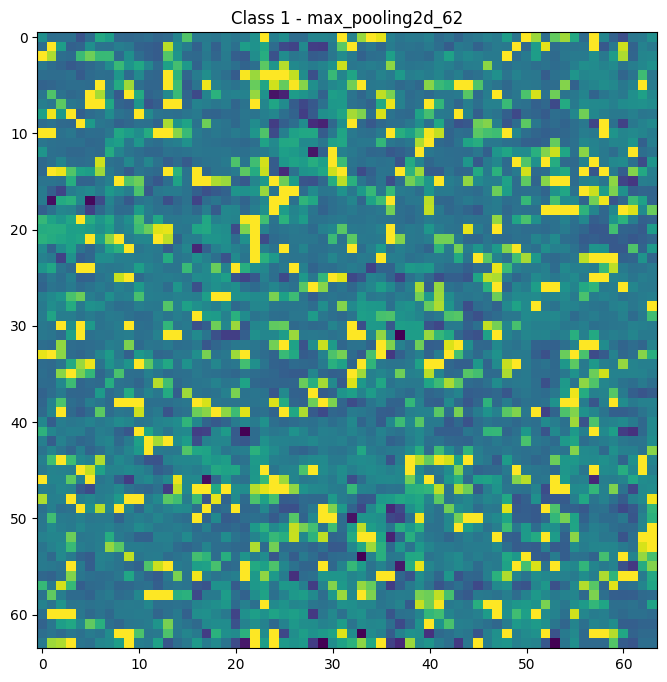

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 2 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


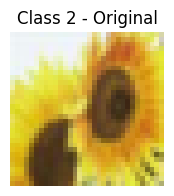

Слой 0: conv2d_75 ((1, 32, 32, 32))


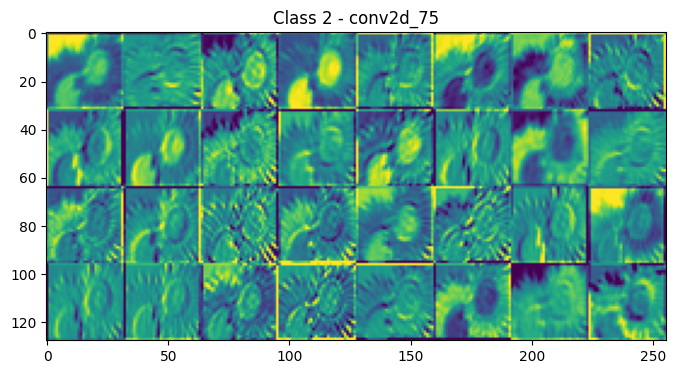

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


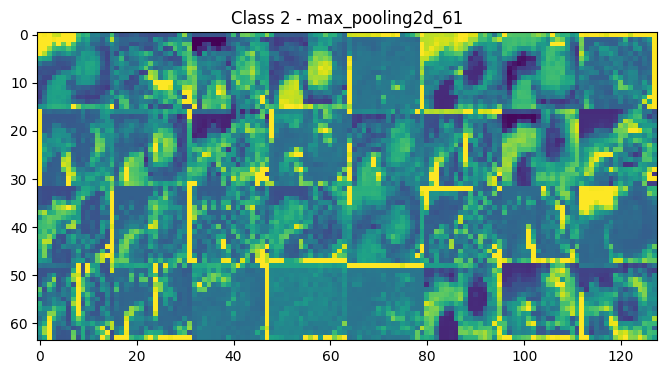

Слой 2: conv2d_76 ((1, 16, 16, 64))


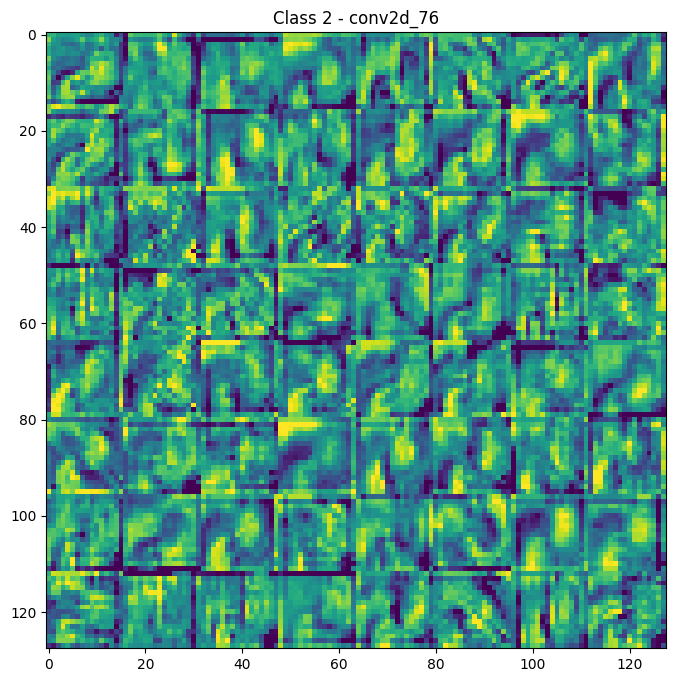

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


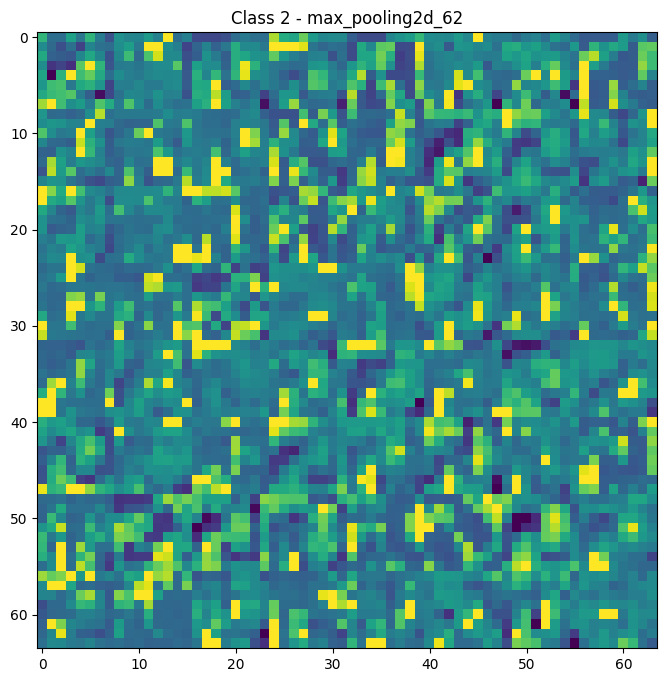

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 3 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


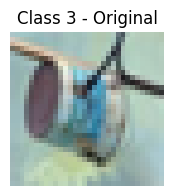

Слой 0: conv2d_75 ((1, 32, 32, 32))


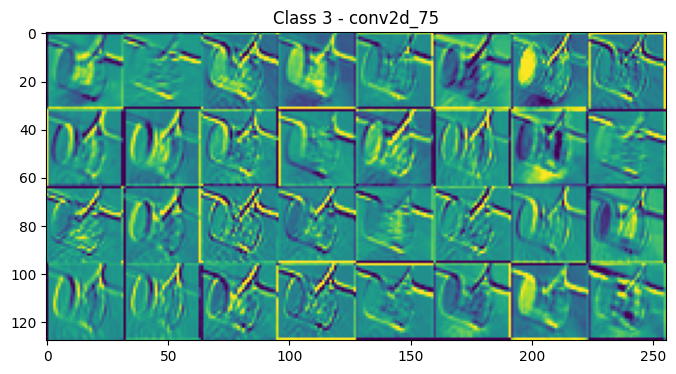

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


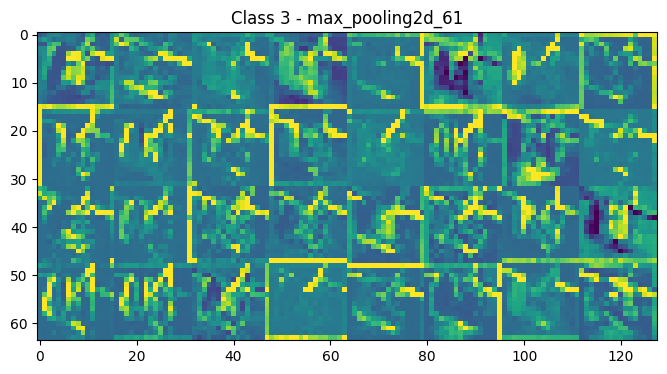

Слой 2: conv2d_76 ((1, 16, 16, 64))


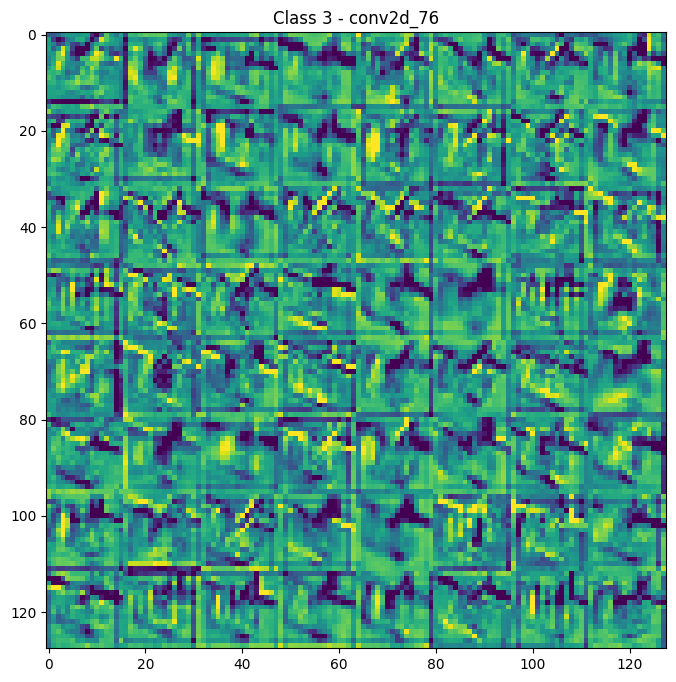

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


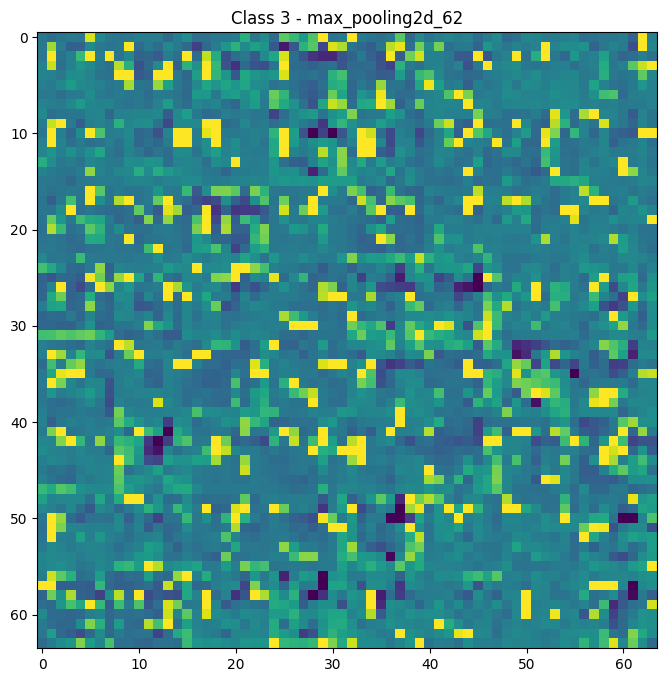

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 4 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


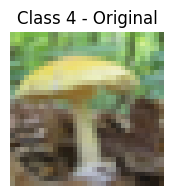

Слой 0: conv2d_75 ((1, 32, 32, 32))


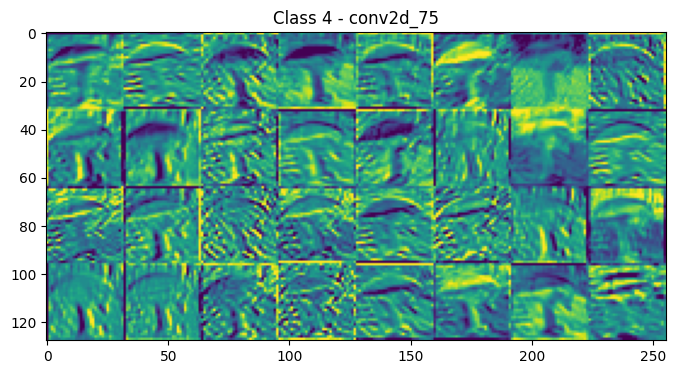

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


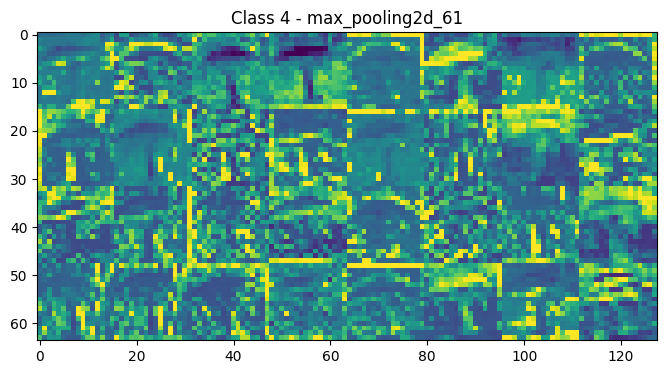

Слой 2: conv2d_76 ((1, 16, 16, 64))


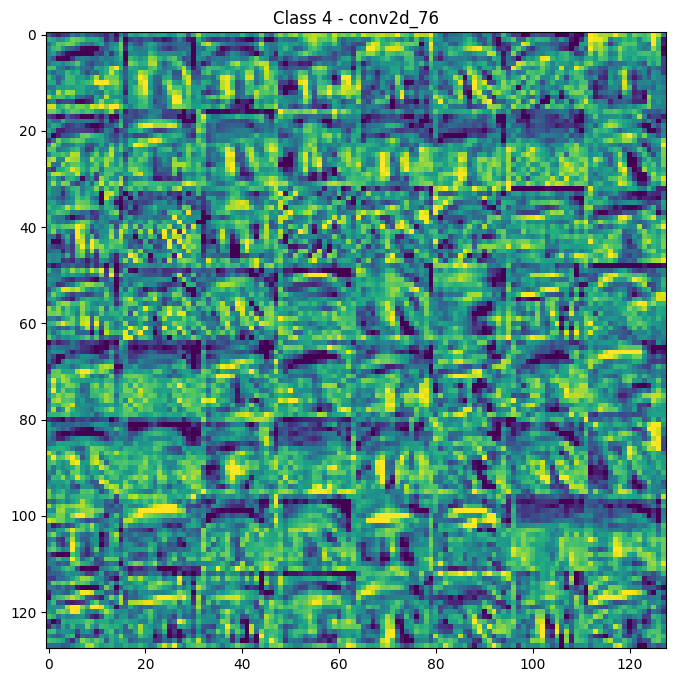

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


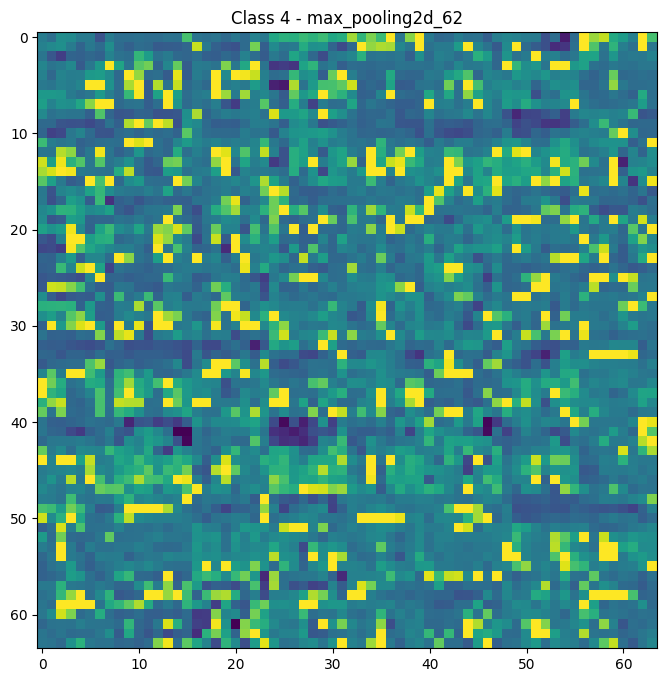

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 5 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


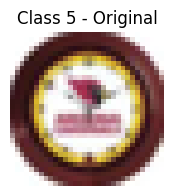

Слой 0: conv2d_75 ((1, 32, 32, 32))


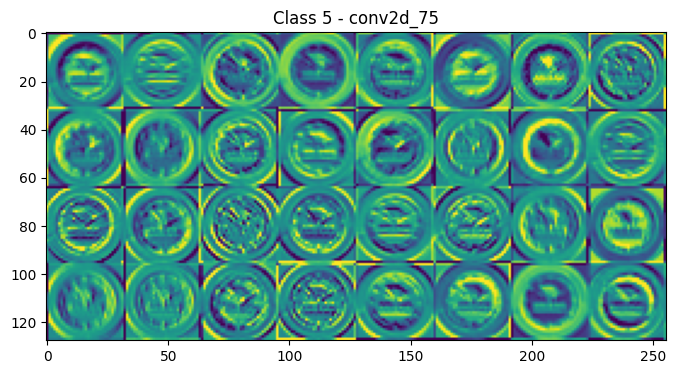

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


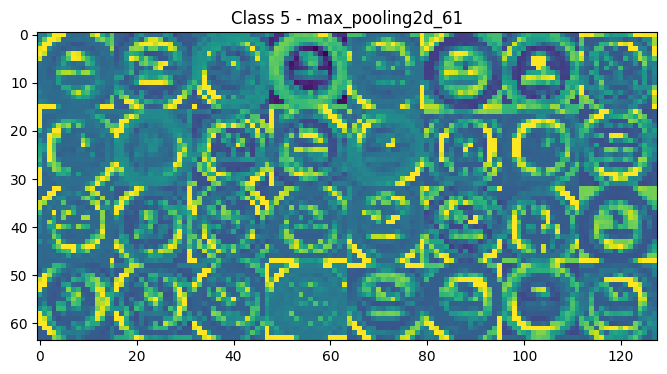

Слой 2: conv2d_76 ((1, 16, 16, 64))


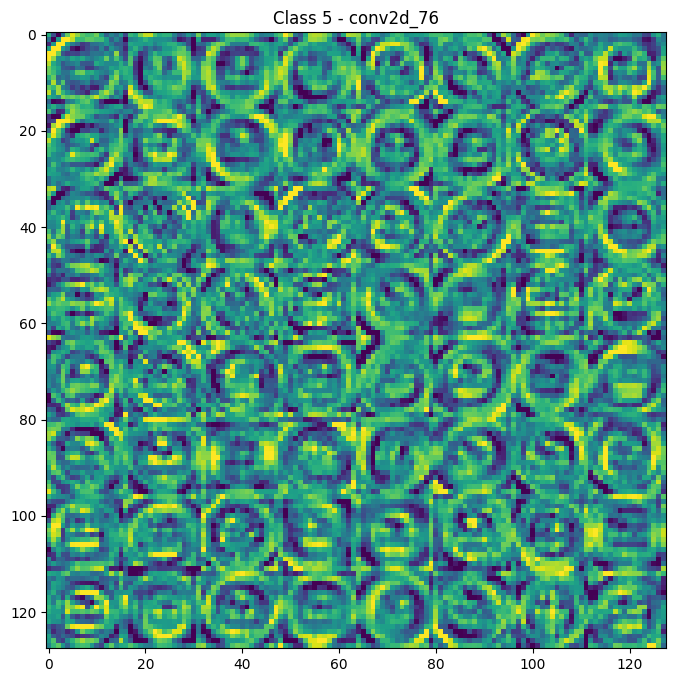

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


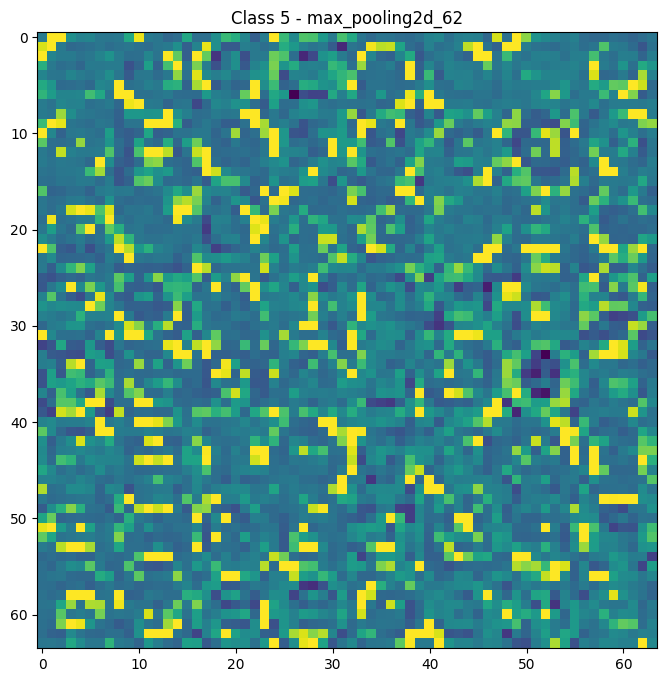

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 6 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


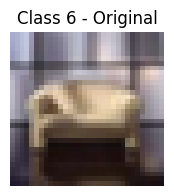

Слой 0: conv2d_75 ((1, 32, 32, 32))


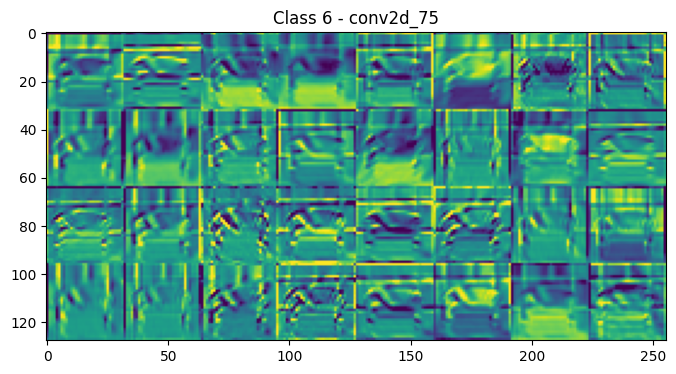

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


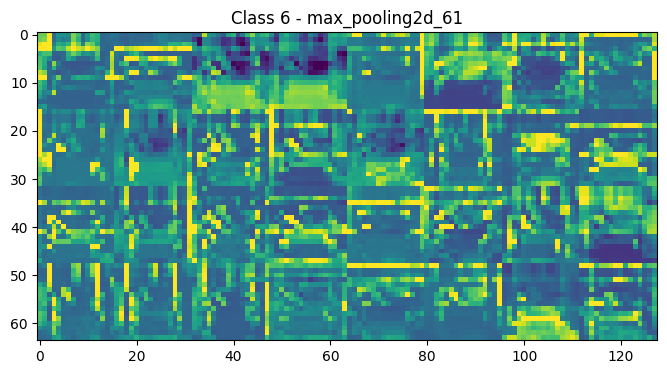

Слой 2: conv2d_76 ((1, 16, 16, 64))


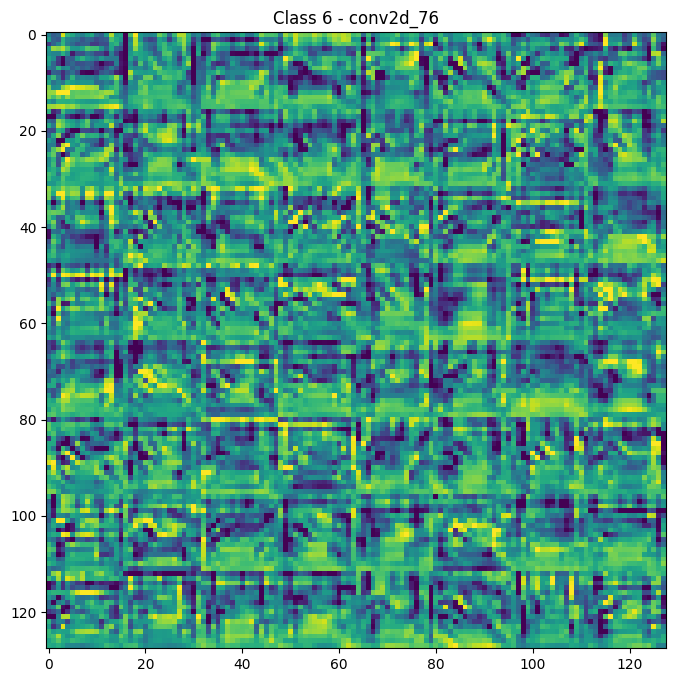

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


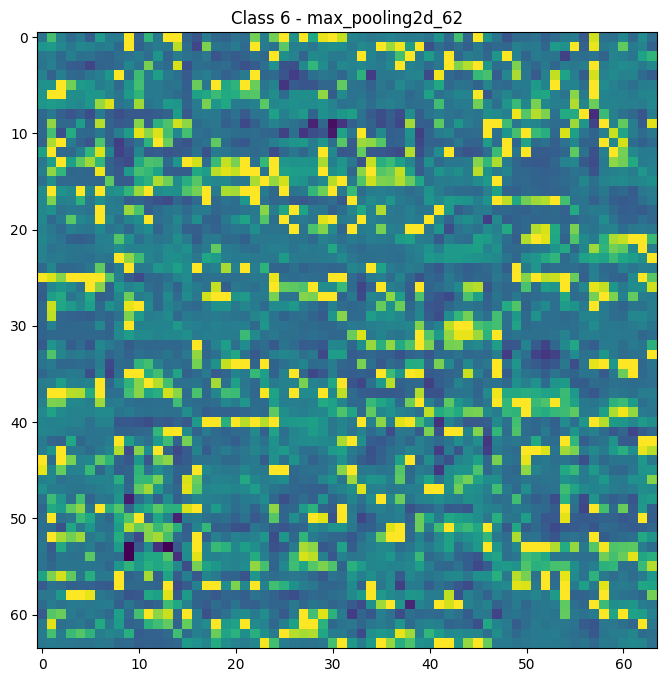

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 7 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


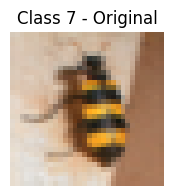

Слой 0: conv2d_75 ((1, 32, 32, 32))


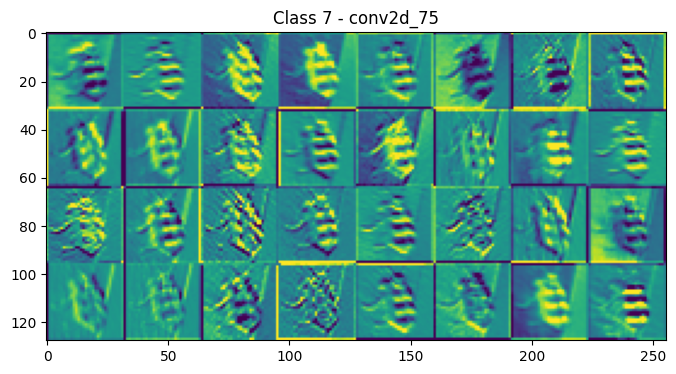

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


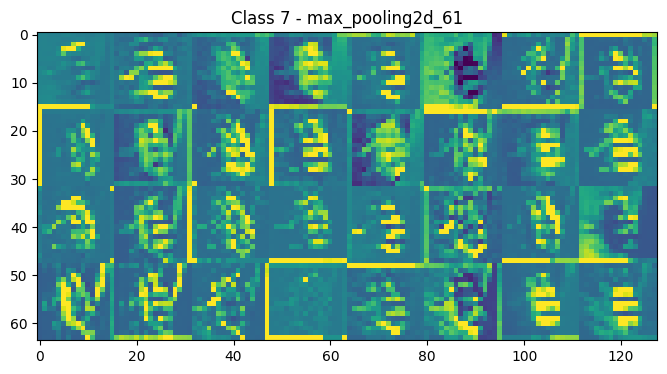

Слой 2: conv2d_76 ((1, 16, 16, 64))


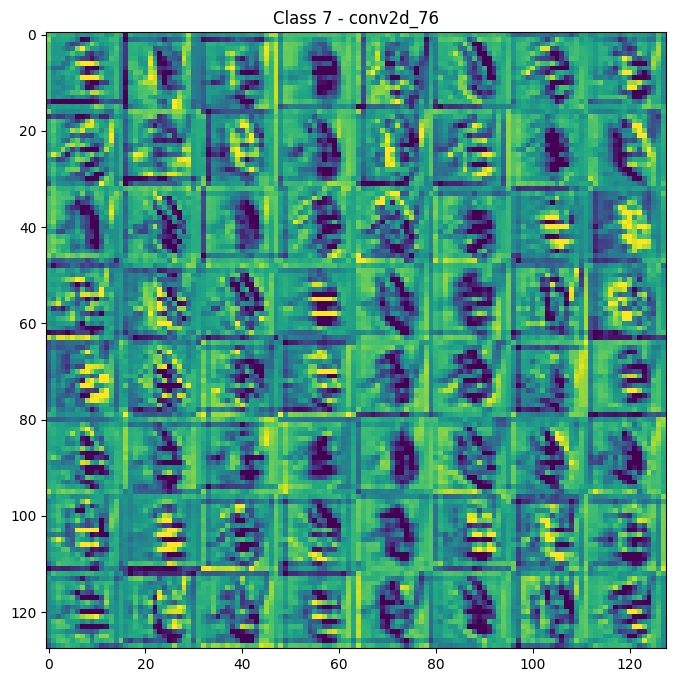

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


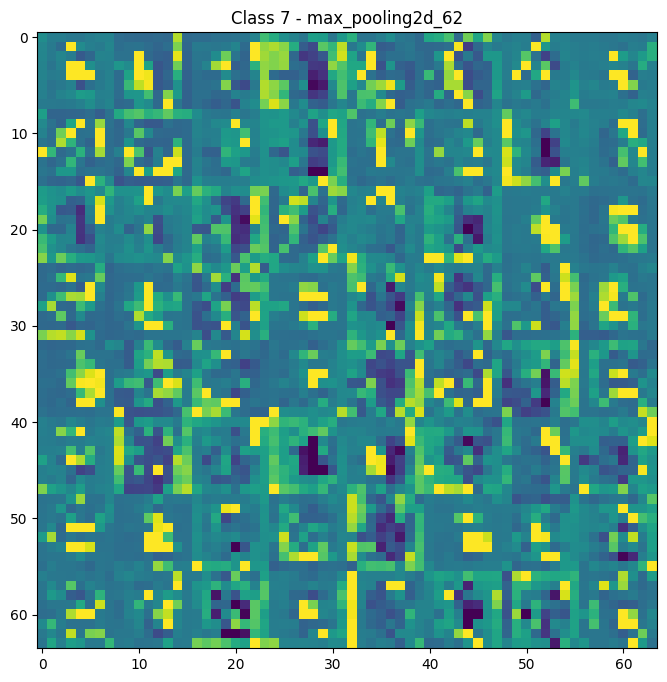

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 8 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


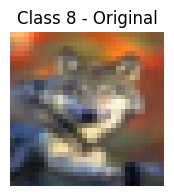

Слой 0: conv2d_75 ((1, 32, 32, 32))


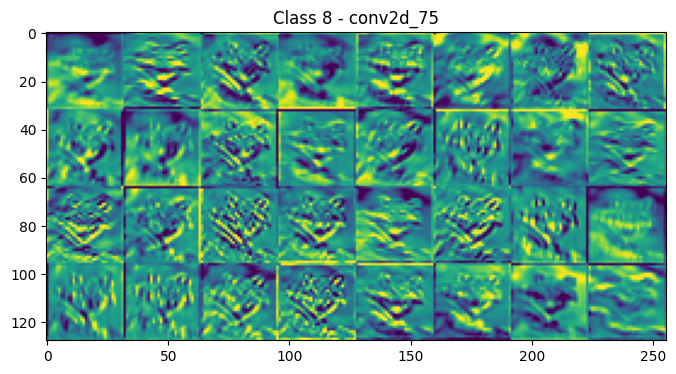

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


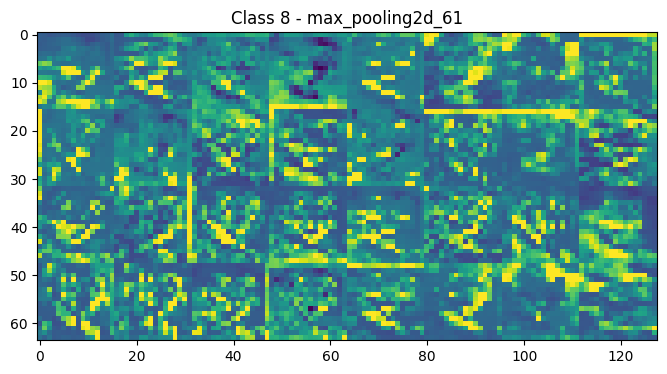

Слой 2: conv2d_76 ((1, 16, 16, 64))


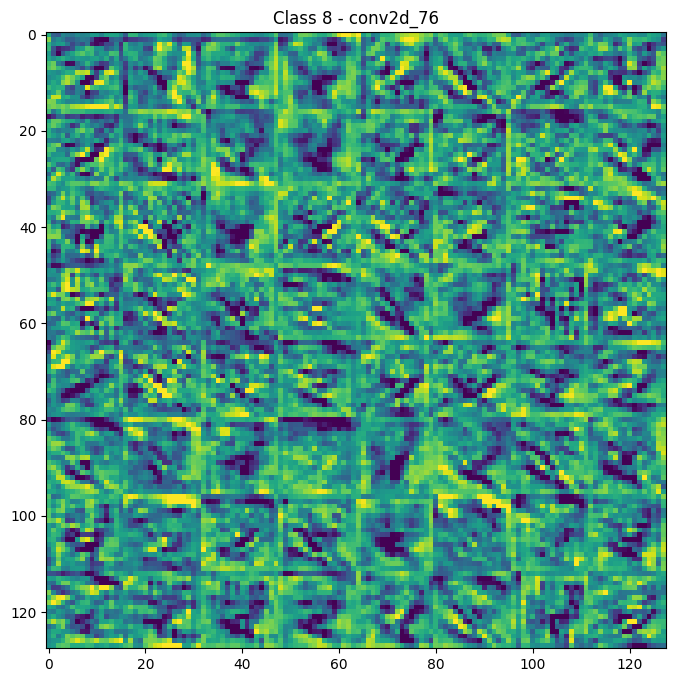

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


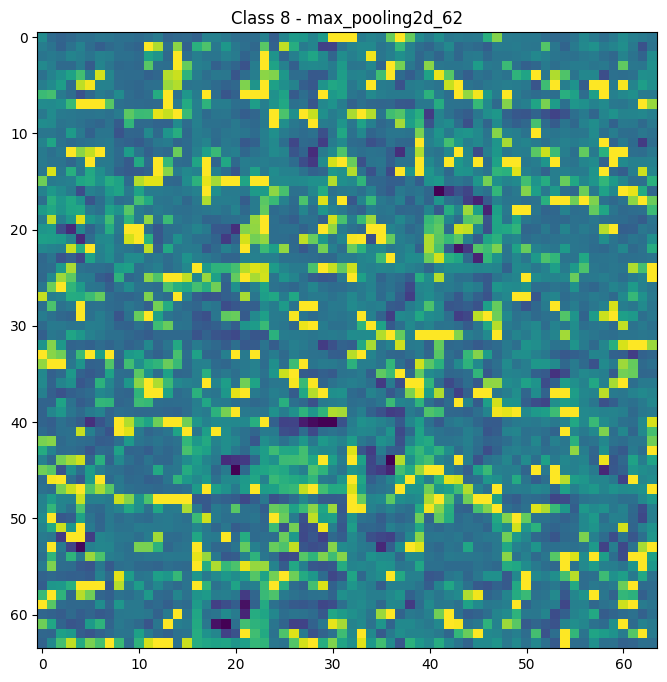

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 9 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


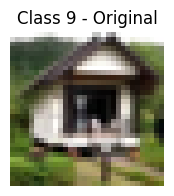

Слой 0: conv2d_75 ((1, 32, 32, 32))


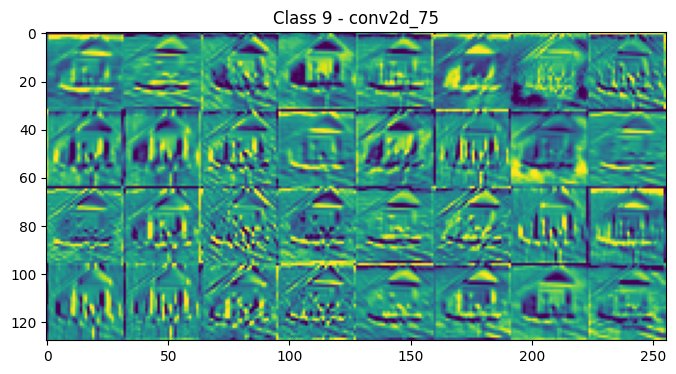

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


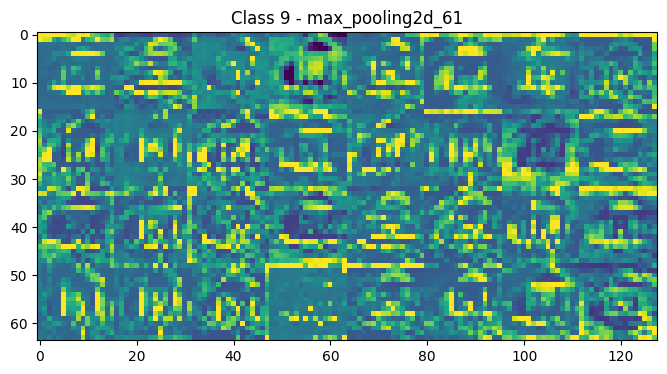

Слой 2: conv2d_76 ((1, 16, 16, 64))


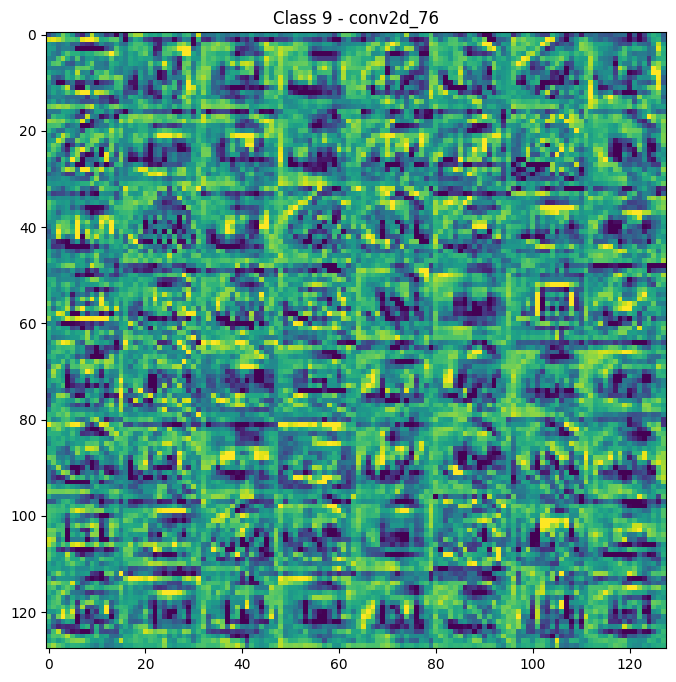

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


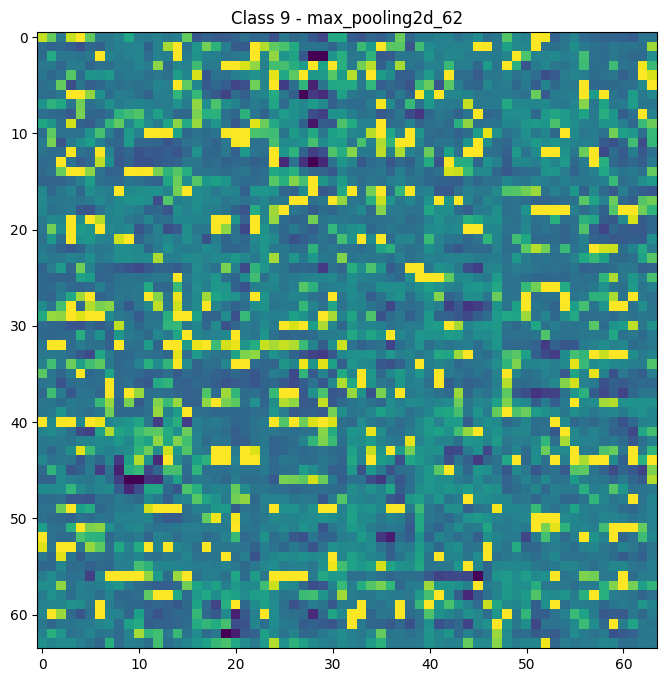

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 10 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


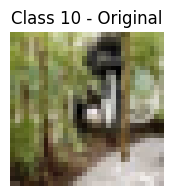

Слой 0: conv2d_75 ((1, 32, 32, 32))


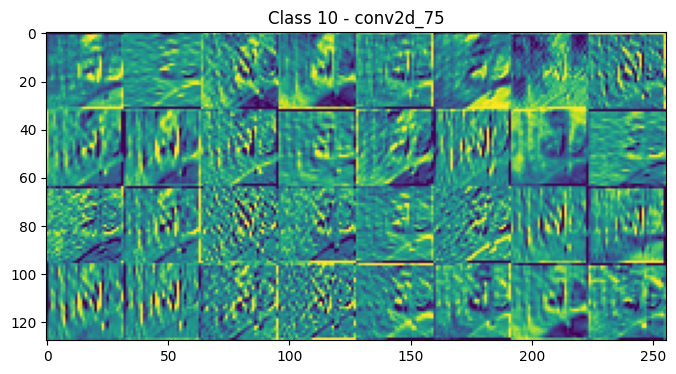

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


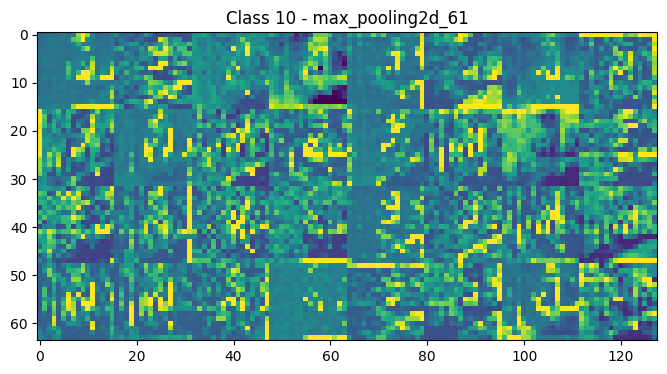

Слой 2: conv2d_76 ((1, 16, 16, 64))


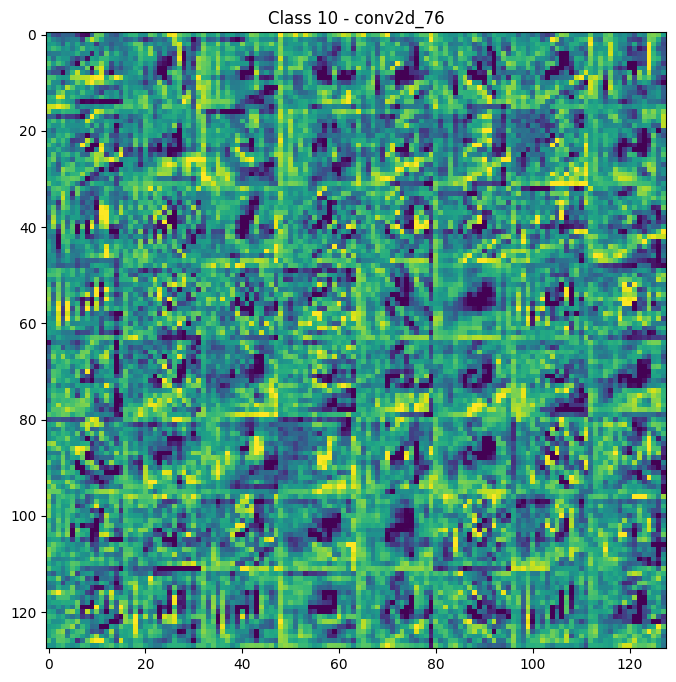

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


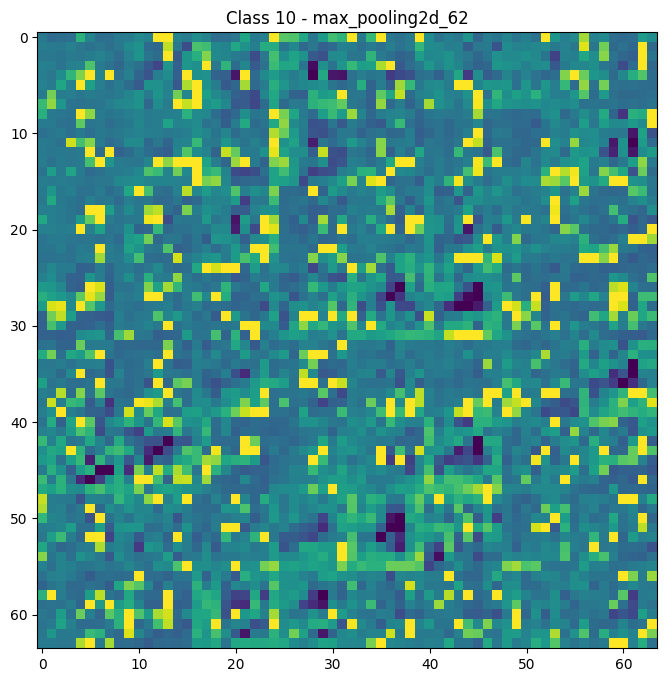

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 11 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


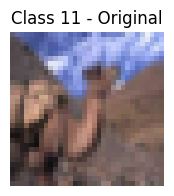

Слой 0: conv2d_75 ((1, 32, 32, 32))


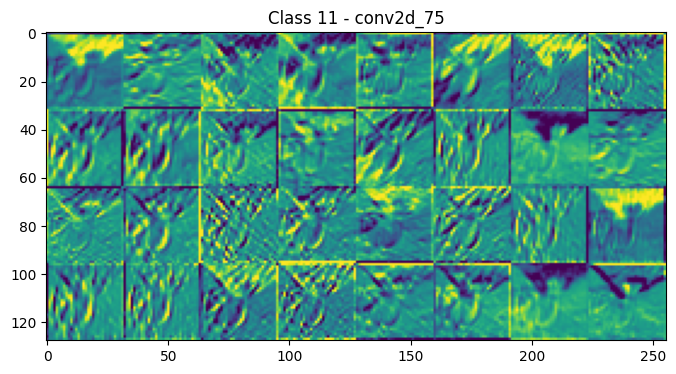

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


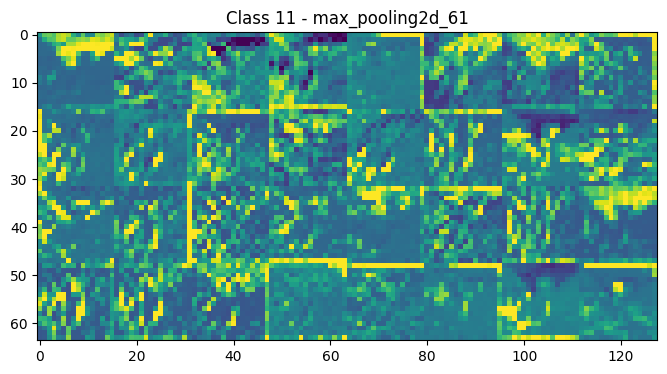

Слой 2: conv2d_76 ((1, 16, 16, 64))


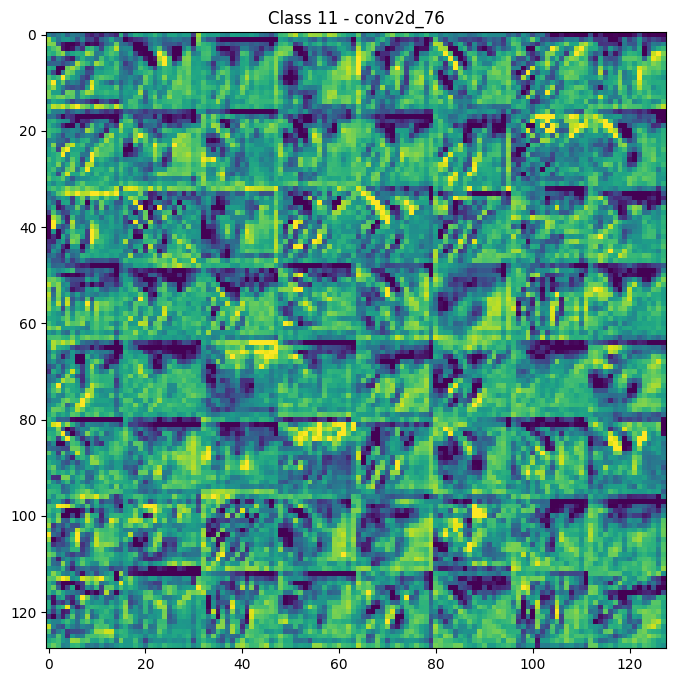

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


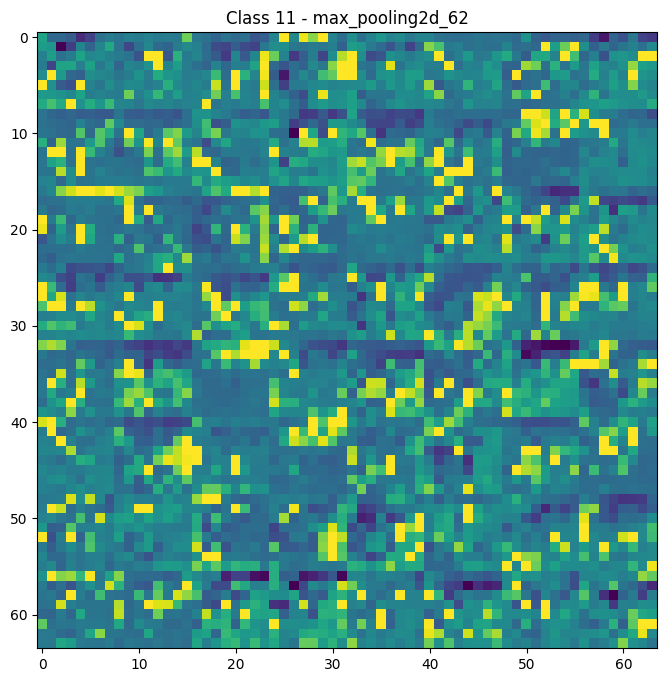

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 12 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


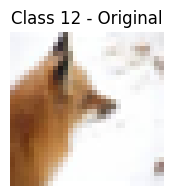

Слой 0: conv2d_75 ((1, 32, 32, 32))


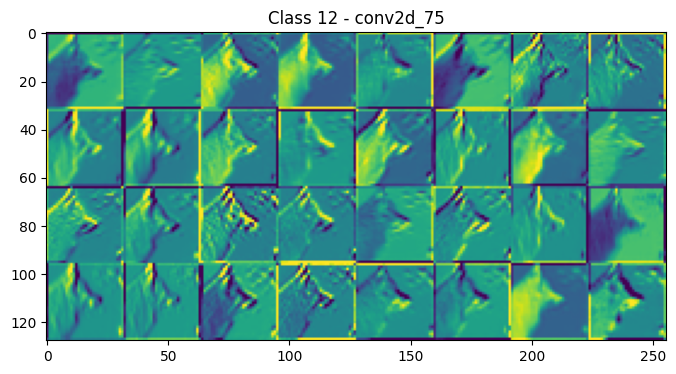

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


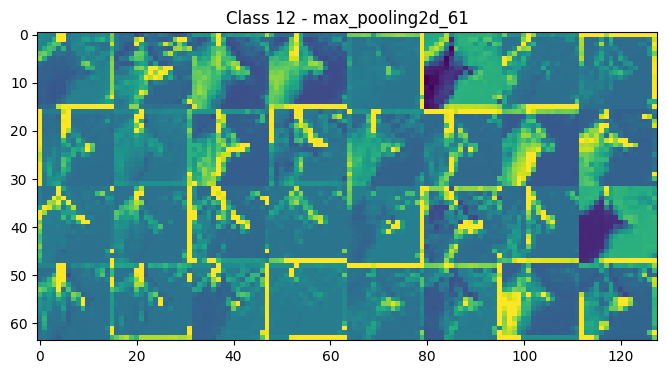

Слой 2: conv2d_76 ((1, 16, 16, 64))


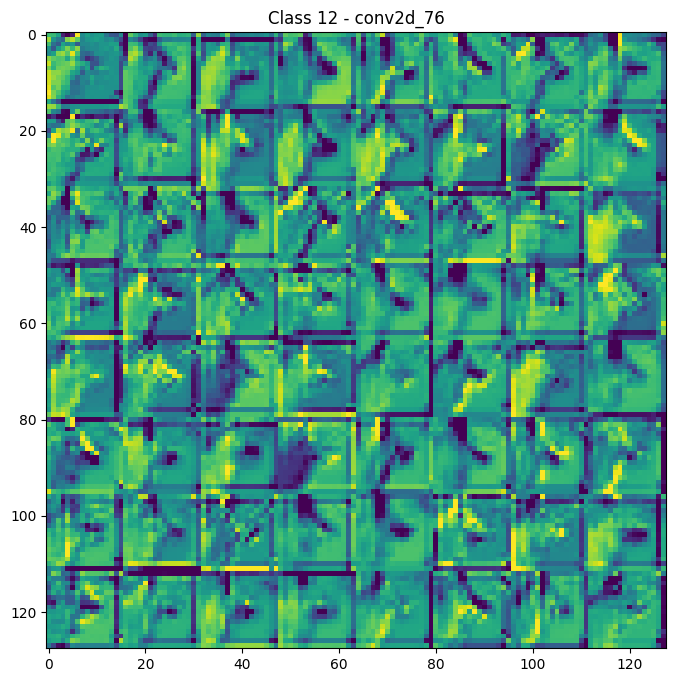

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


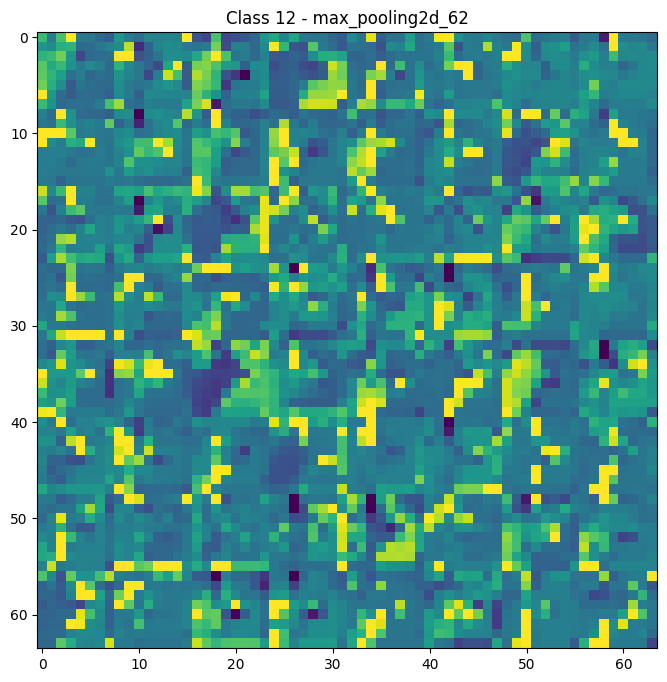

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 13 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


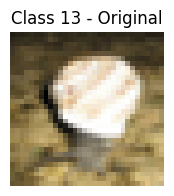

Слой 0: conv2d_75 ((1, 32, 32, 32))


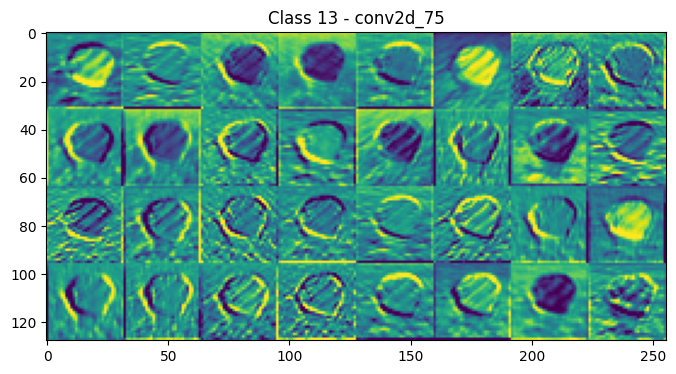

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


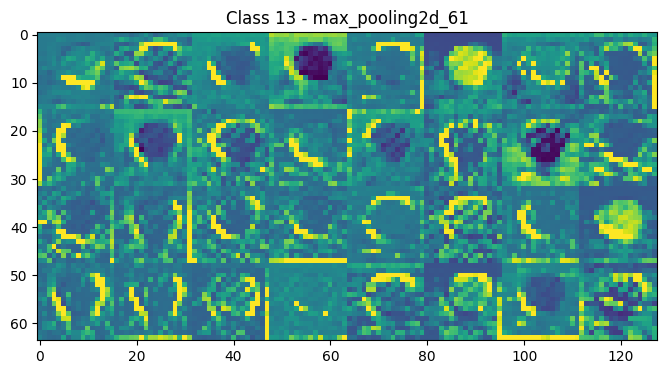

Слой 2: conv2d_76 ((1, 16, 16, 64))


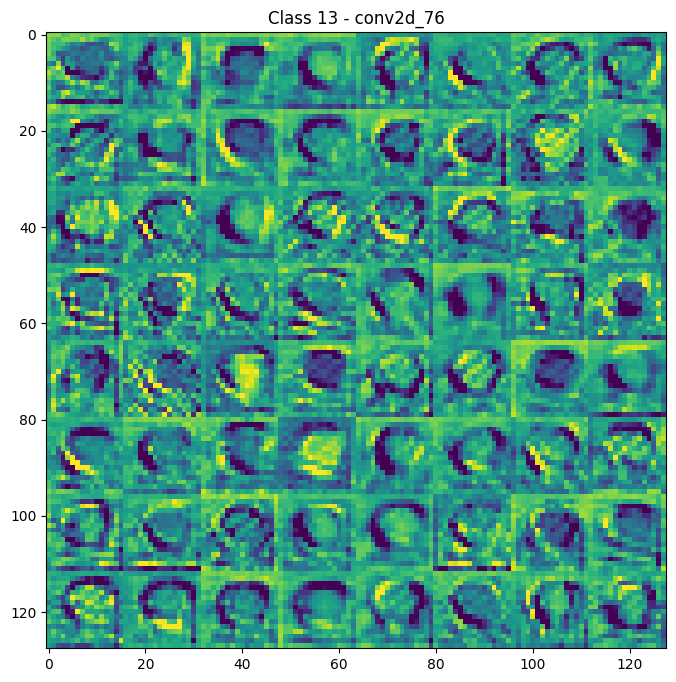

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


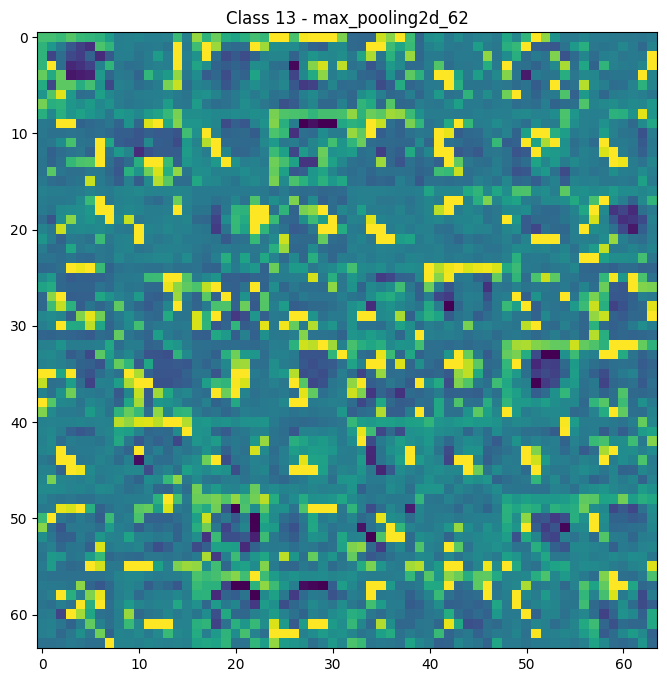

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 14 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


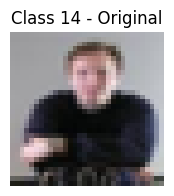

Слой 0: conv2d_75 ((1, 32, 32, 32))


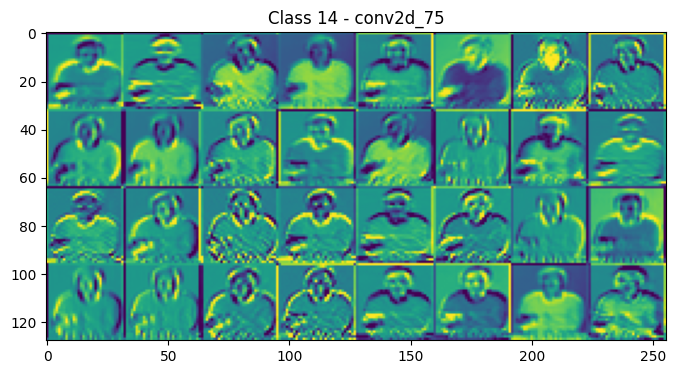

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


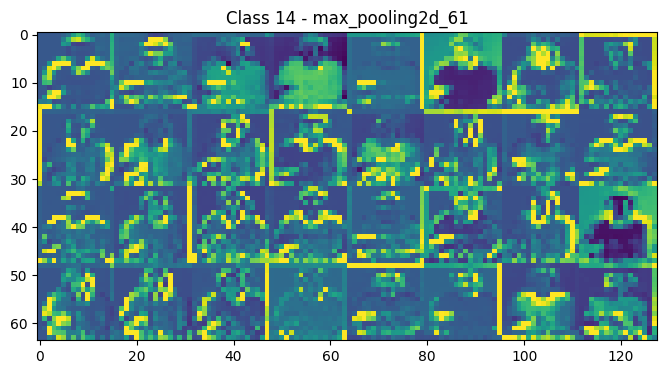

Слой 2: conv2d_76 ((1, 16, 16, 64))


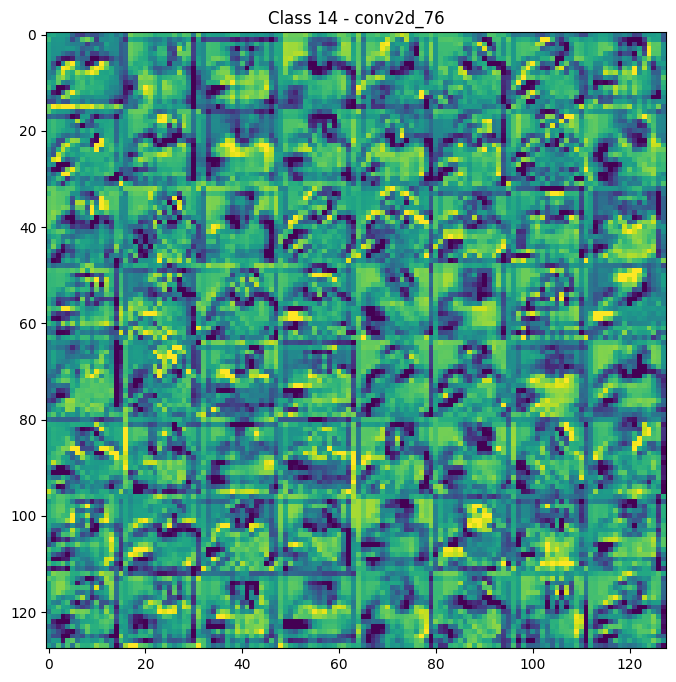

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


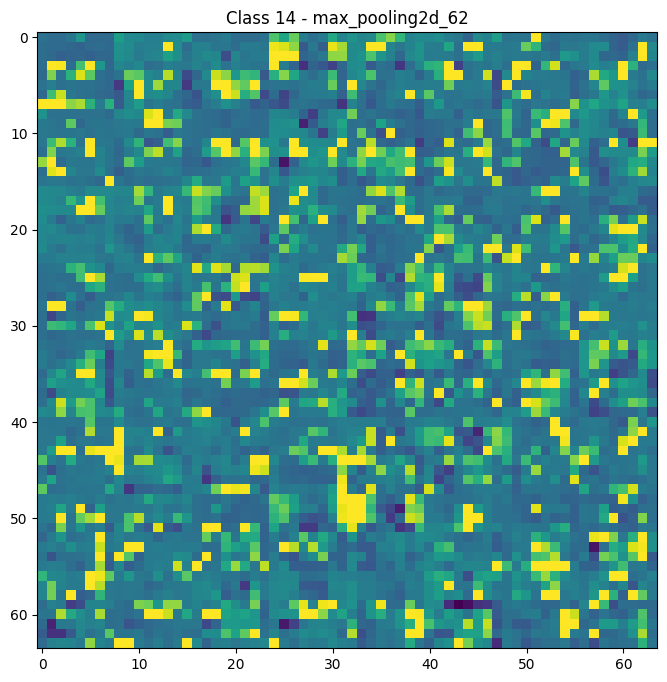

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 15 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


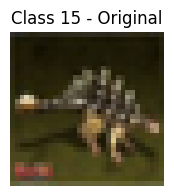

Слой 0: conv2d_75 ((1, 32, 32, 32))


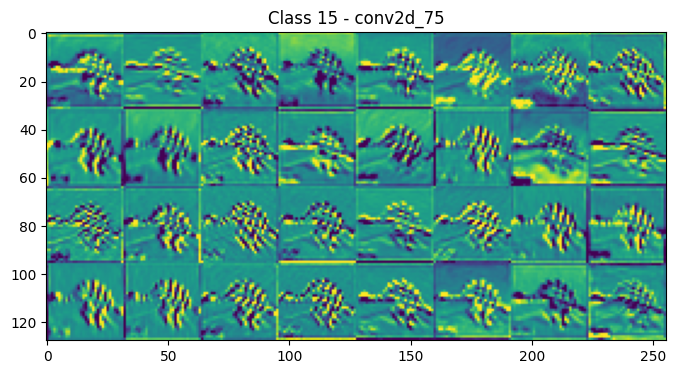

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


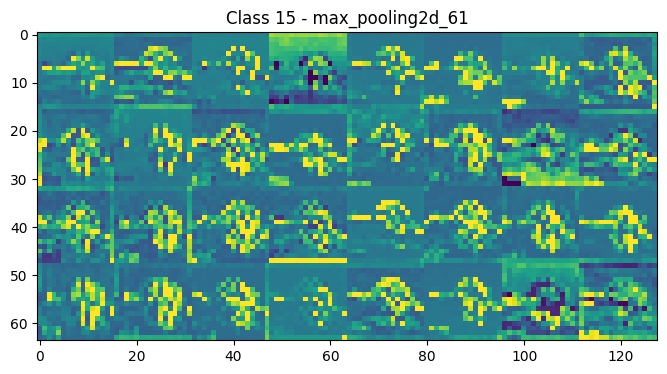

Слой 2: conv2d_76 ((1, 16, 16, 64))


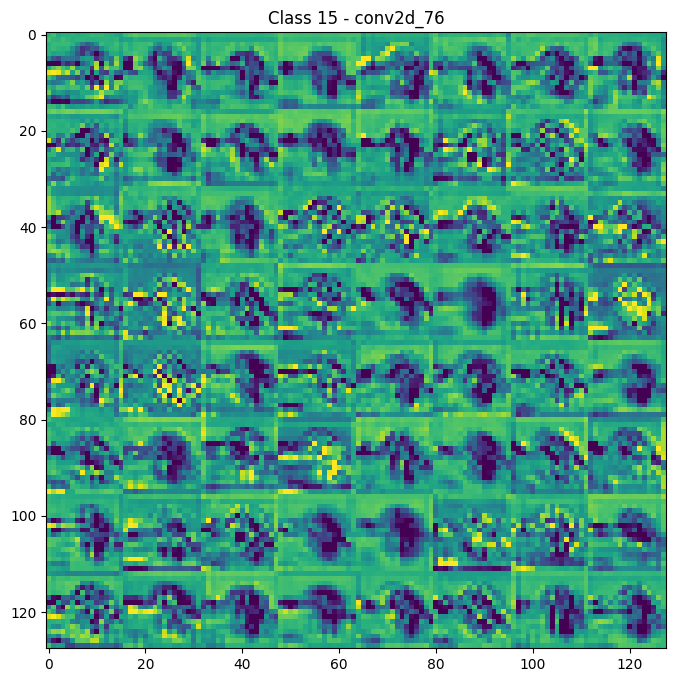

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


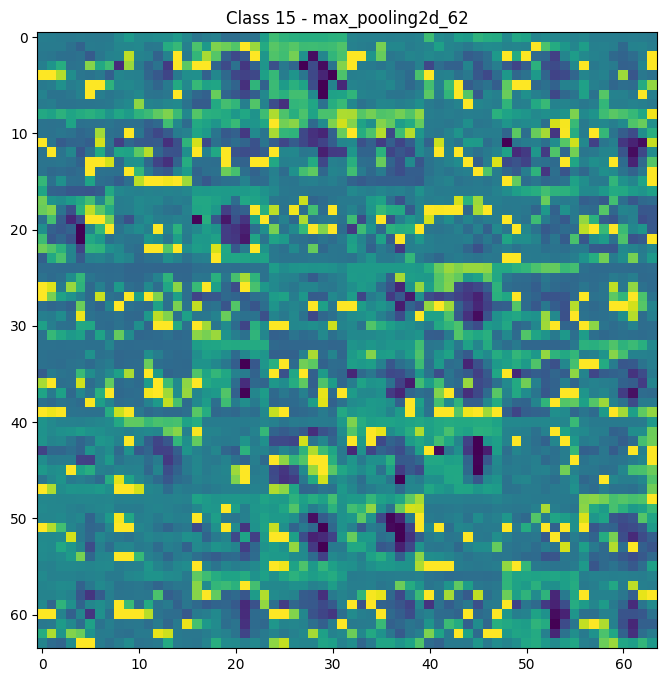

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 16 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


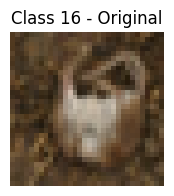

Слой 0: conv2d_75 ((1, 32, 32, 32))


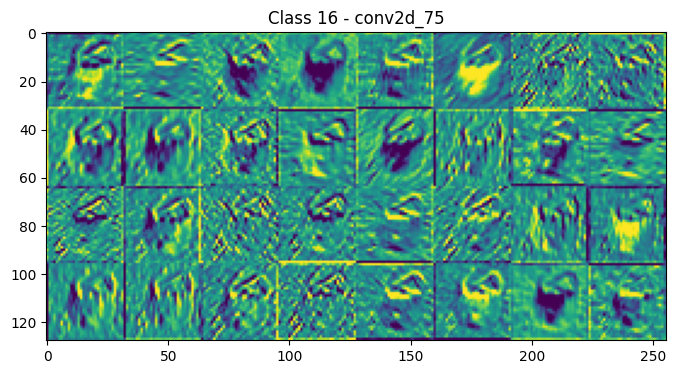

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


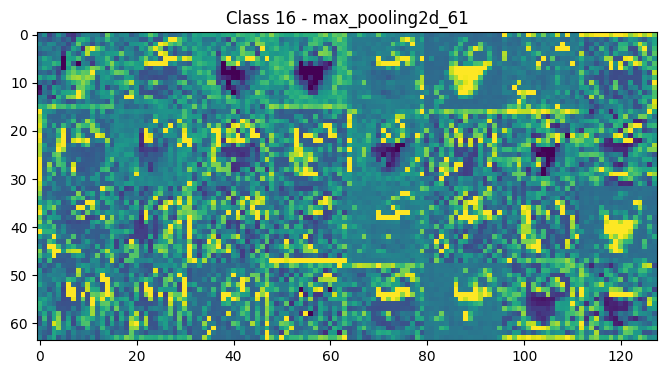

Слой 2: conv2d_76 ((1, 16, 16, 64))


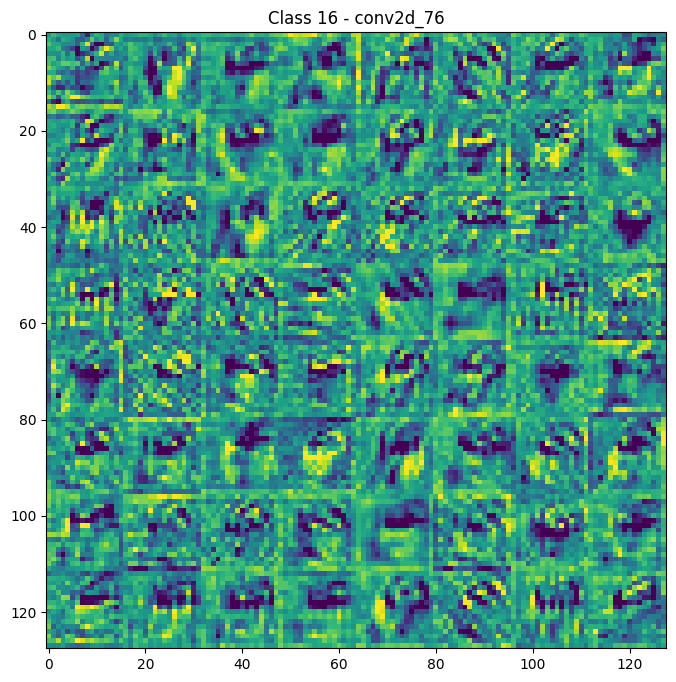

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


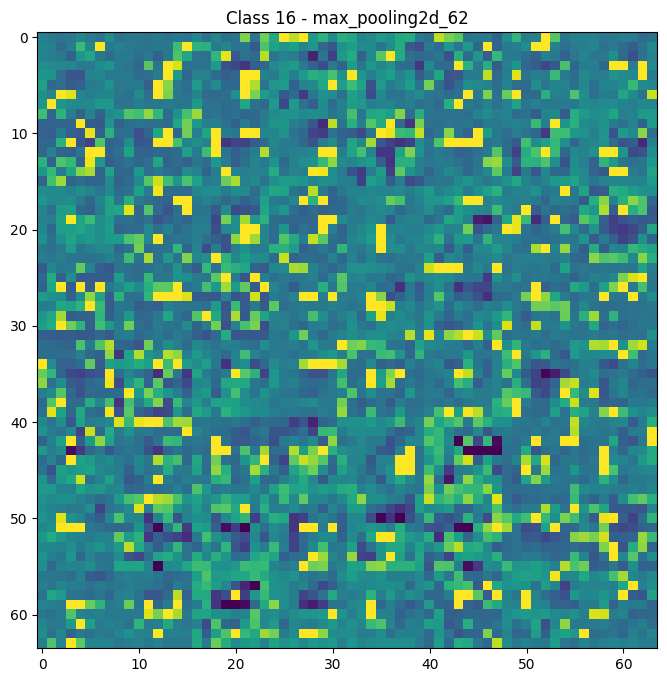

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 17 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


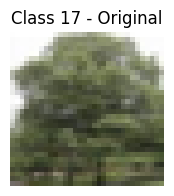

Слой 0: conv2d_75 ((1, 32, 32, 32))


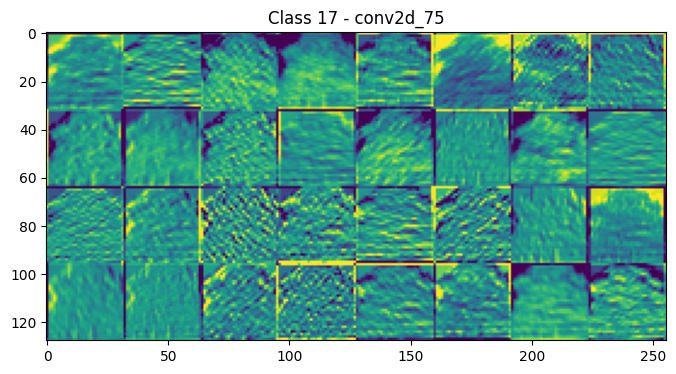

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


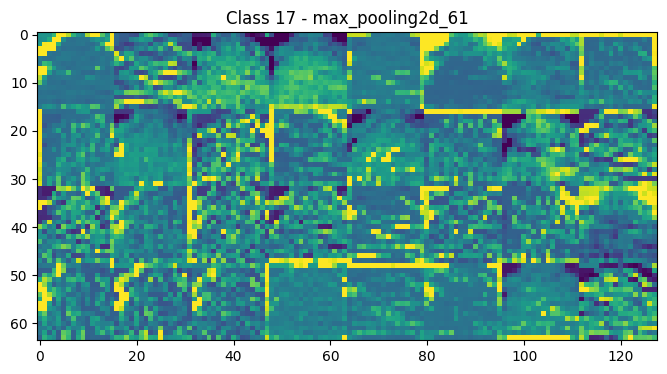

Слой 2: conv2d_76 ((1, 16, 16, 64))


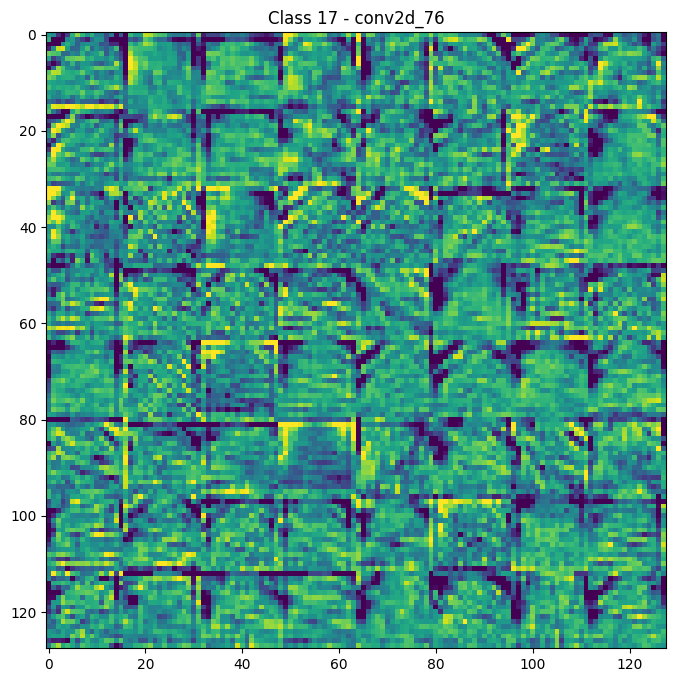

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


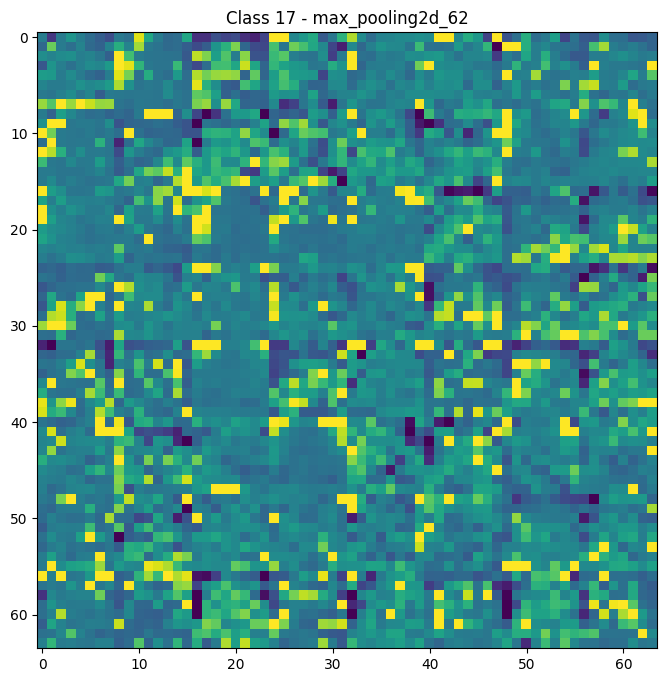

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 18 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


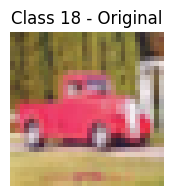

Слой 0: conv2d_75 ((1, 32, 32, 32))


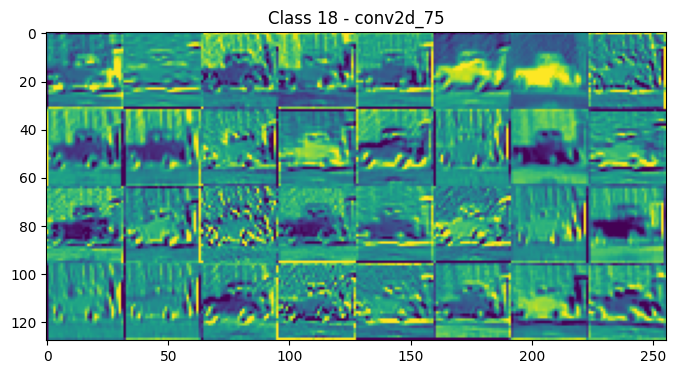

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


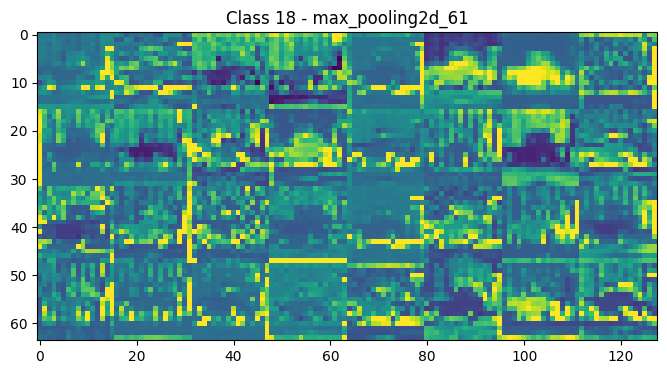

Слой 2: conv2d_76 ((1, 16, 16, 64))


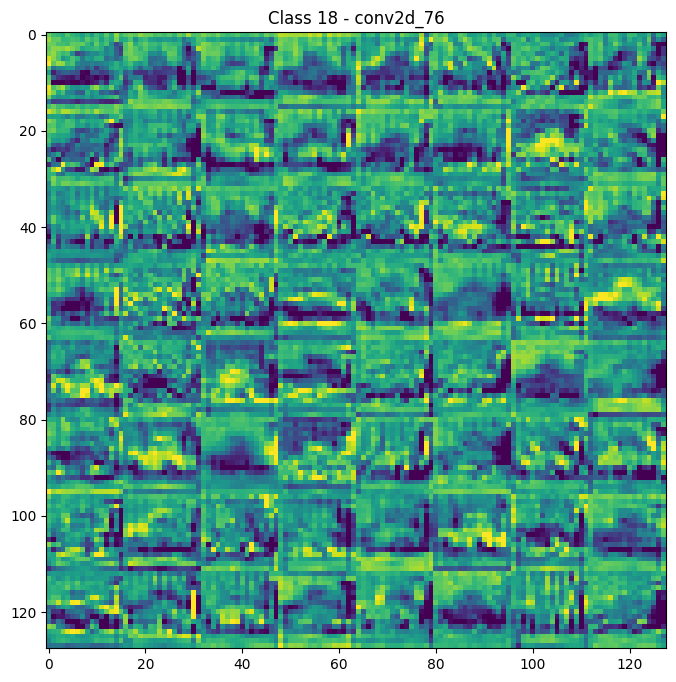

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


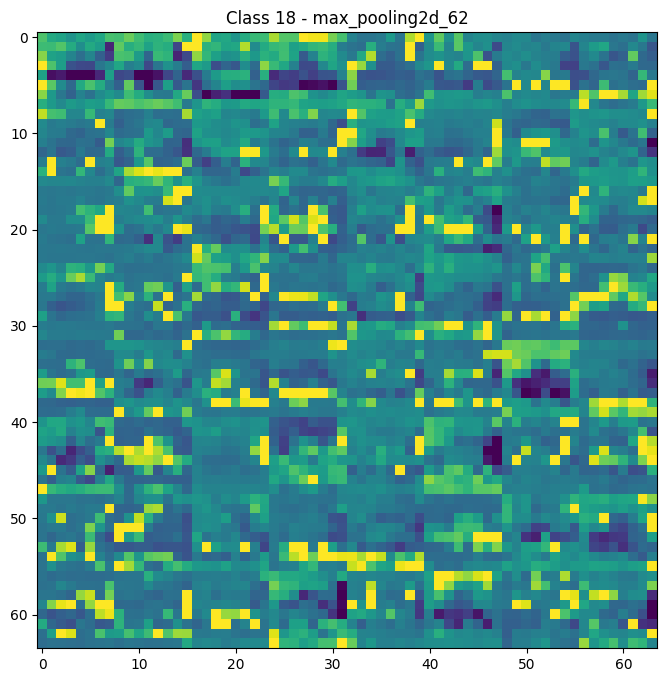

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))

=== Класс 19 ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


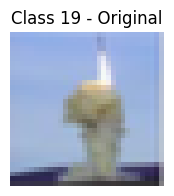

Слой 0: conv2d_75 ((1, 32, 32, 32))


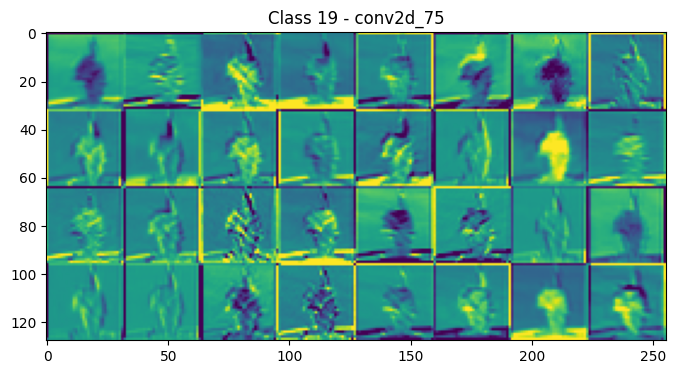

Слой 1: max_pooling2d_61 ((1, 16, 16, 32))


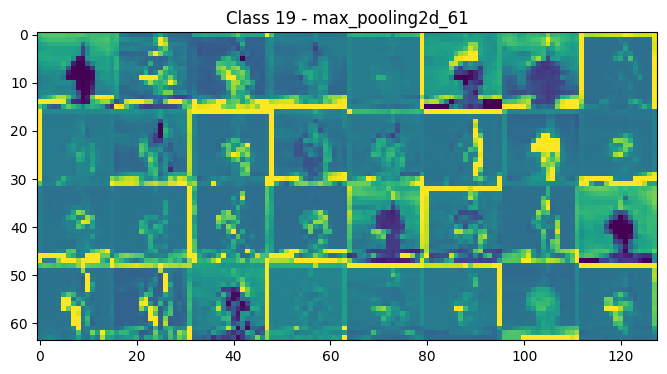

Слой 2: conv2d_76 ((1, 16, 16, 64))


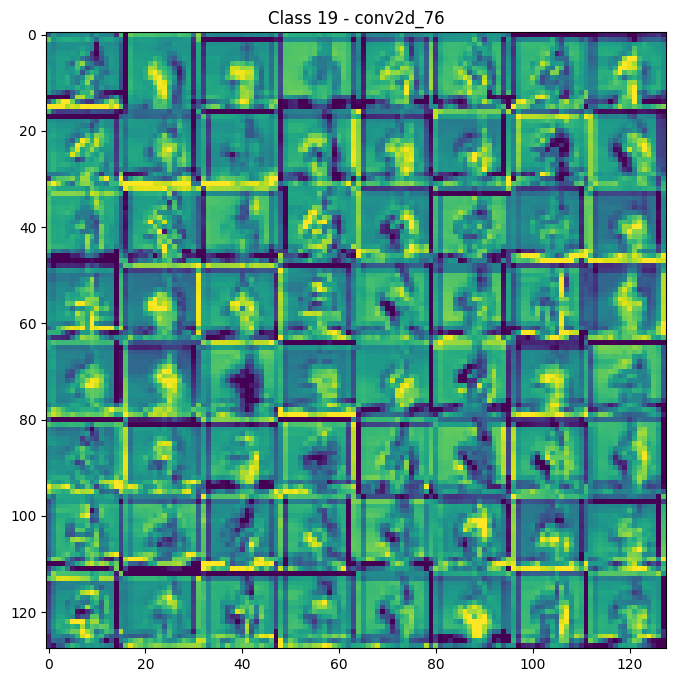

Слой 3: max_pooling2d_62 ((1, 8, 8, 64))


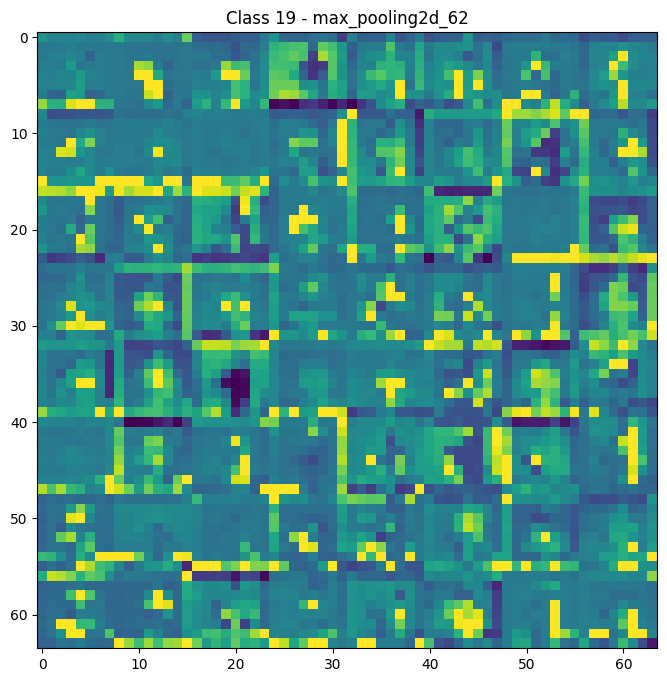

Слой 4: batch_normalization_45 ((1, 128))
Слой 5: batch_normalization_46 ((1, 20))


In [134]:
def visualize_activations_by_class(model, X_test, y_test, num_classes=20, samples_per_class=1):
    """
    Визуализирует карты активации модели для каждого класса отдельно

    Args:
        model: Обученная модель Keras
        X_test: Тестовые изображения
        y_test: Метки классов (one-hot encoded)
        num_classes: Количество классов
        samples_per_class: Количество примеров для визуализации на класс
    """
    # Альтернативный способ получить input tensor для Sequential модели
    input_layer = Input(shape=model.input_shape[1:])
    prev_layer = input_layer

    # Собираем все слои модели
    layers_outputs = []
    for layer in model.layers:
        prev_layer = layer(prev_layer)
        if isinstance(layer, (Conv2D, MaxPooling2D, BatchNormalization)):
            layers_outputs.append(prev_layer)

    # Создаем модель для извлечения активаций
    activation_model = Model(inputs=input_layer, outputs=layers_outputs)

    # Для каждого класса
    for class_id in range(num_classes):
        print(f"\n=== Класс {class_id} ===")

        # Выбираем примеры данного класса
        class_indices = np.where(np.argmax(y_test, axis=1) == class_id)[0]
        if len(class_indices) == 0:
            print(f"Нет примеров для класса {class_id}")
            continue

        # Берем samples_per_class случайных примеров
        selected_indices = np.random.choice(class_indices,
                                         size=min(samples_per_class, len(class_indices)),
                                         replace=False)

        for idx in selected_indices:
            # Подготавливаем изображение
            img = X_test[idx].reshape(1, *model.input_shape[1:])

            # Получаем активации
            activations = activation_model.predict(img)

            # Визуализируем оригинальное изображение
            plt.figure(figsize=(2, 2))
            plt.imshow(img[0])
            plt.title(f"Class {class_id} - Original")
            plt.axis('off')
            plt.show()

            # Визуализируем активации для каждого слоя
            layer_names = [layer.name for layer in model.layers
                         if isinstance(layer, (Conv2D, MaxPooling2D, BatchNormalization))]

            for i, (layer_activation, layer_name) in enumerate(zip(activations, layer_names)):
                print(f"Слой {i}: {layer_name} ({layer_activation.shape})")

                # Для Conv2D и BatchNorm слоев
                if len(layer_activation.shape) == 4:
                    n_features = layer_activation.shape[-1]
                    size = layer_activation.shape[1]
                    n_cols = n_features // 8
                    if n_features % 8 != 0:
                        n_cols += 1

                    display_grid = np.zeros((size * n_cols, size * 8))

                    for col in range(n_cols):
                        for row in range(8):
                            channel_idx = col * 8 + row
                            if channel_idx < n_features:
                                channel_image = layer_activation[0, :, :, channel_idx]
                                # Нормализация для визуализации
                                channel_image -= channel_image.mean()
                                if channel_image.std() > 0:
                                    channel_image /= channel_image.std()
                                channel_image *= 64
                                channel_image += 128
                                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                                display_grid[col * size : (col + 1) * size,
                                            row * size : (row + 1) * size] = channel_image

                    plt.figure(figsize=(8, n_cols))
                    plt.title(f"Class {class_id} - {layer_name}")
                    plt.grid(False)
                    plt.imshow(display_grid, aspect='auto', cmap='viridis')
                    plt.show()

                # Для MaxPooling слоев
                elif len(layer_activation.shape) == 3:
                    plt.figure(figsize=(4, 4))
                    plt.title(f"Class {class_id} - {layer_name}")
                    plt.imshow(layer_activation[0], cmap='viridis')
                    plt.colorbar()
                    plt.show()

# Вызываем функцию визуализации
visualize_activations_by_class(model_4, X_test, y_test, num_classes=20, samples_per_class=1)

## Задание 2. Загрузите Ваш датасет из предыдущей работы. Разделите его на обучающую и тестовую выборки. Обучите модель классификации с применением BatchNorm() и Dropout(). Сравните точность с моделями, обученными Вами ранее. Визуализируйте карты активаций.

In [135]:
! pip install wldhx.yadisk-direct
! curl -L $(yadisk-direct https://disk.yandex.ru/d/WA8k7NGVrqm7hQ) -o arch.zip
! unzip -qq arch.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100 95.5M  100 95.5M    0     0  10.9M      0  0:00:08  0:00:08 --:--:-- 19.5M


In [136]:
from imutils import paths
import random
import cv2
import os
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split

data = []
labels = []

imagePaths = sorted(list(paths.list_images("/content/Vegetable Images/train")))
random.shuffle(imagePaths)

# формируем выборку
for imagePath in imagePaths:

	image = cv2.imread(imagePath)
	image = cv2.resize(image, (32, 32))

	data.append(image)

	label = imagePath.split(os.path.sep)[-2]
	labels.append(label)

data = np.array(data, dtype="float")
labels = np.array(labels)

(X_train, X_test, y_train, y_test) = train_test_split(data,
	labels, test_size=0.25, random_state=42)

X_train = X_train / 255
X_test = X_test / 255

lb = LabelBinarizer()
y_train = lb.fit_transform(y_train)
y_test = lb.transform(y_test)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2250, 32, 32, 3), (750, 32, 32, 3), (2250, 3), (750, 3))

In [137]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Activation, ReLU, Input
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Model

# Создаём входной слой
inputs = Input(shape=(32, 32, 3))

# Добавляем остальные слои
x = Conv2D(32, (3,3), padding='same')(inputs)
x = ReLU()(x)
x = MaxPooling2D((2, 2), strides=2)(x)
# x = Dropout(0.1)(x)
x = Flatten()(x)
x = Dropout(0.2)(x)
x = Dense(12)(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Dense(3)(x)
# x = BatchNormalization()(x)
outputs = Activation("softmax")(x)

# Определяем модель
model = Model(inputs=inputs, outputs=outputs)

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

early_stopping = EarlyStopping(patience=5)

checkpoint = ModelCheckpoint(filepath="best_model_4_5.keras",
                             monitor="val_accuracy",
                             save_best_only=True,
                             verbose=0)

In [138]:
model_history = model.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=200,
                              epochs=15,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 278ms/step - accuracy: 0.7093 - loss: 0.7571 - val_accuracy: 0.5307 - val_loss: 0.8061
Epoch 2/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.9247 - loss: 0.3827 - val_accuracy: 0.7053 - val_loss: 0.7595
Epoch 3/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9462 - loss: 0.3024 - val_accuracy: 0.8853 - val_loss: 0.6942
Epoch 4/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9543 - loss: 0.2620 - val_accuracy: 0.9253 - val_loss: 0.6257
Epoch 5/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9716 - loss: 0.2204 - val_accuracy: 0.9507 - val_loss: 0.5501
Epoch 6/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9827 - loss: 0.1919 - val_accuracy: 0.9160 - val_loss: 0.4804
Epoch 7/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9860 - loss: 0.1626 - val_accuracy: 0.9587 - val_loss: 0.3745
Epoch 8/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.9935 - loss: 0.1329 - val_accuracy: 0.9640 - 

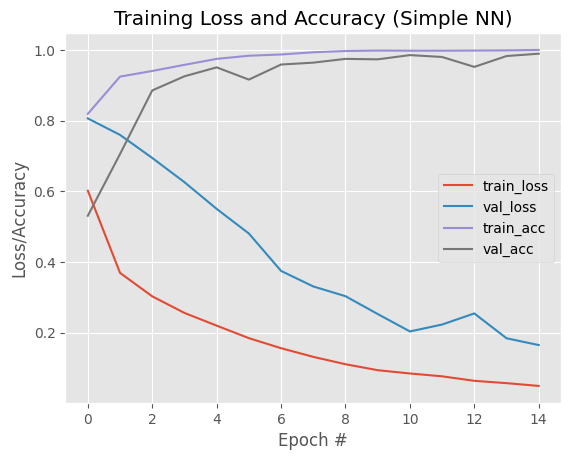

In [139]:
# строим графики потерь и точности
EPOCHS = 15

N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, model_history.history["loss"], label="train_loss")
plt.plot(N, model_history.history["val_loss"], label="val_loss")
plt.plot(N, model_history.history["accuracy"], label="train_acc")
plt.plot(N, model_history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.savefig('plot.png')

In [140]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def show_metrics(model):
  pred = model.predict(X_test)
  Y_pred = pred.argmax(axis=1)
  Y_val = y_test.argmax(axis=1)
  print('Отчёт классификации:', classification_report(Y_val, Y_pred),
        sep = '\n\n', end = '\n\n')

  conf_mat = confusion_matrix(Y_val, Y_pred)
  sns.heatmap(conf_mat, annot=True, fmt="d", cmap="YlGnBu")
  plt.show()

In [142]:
model_3_1 = load_model('/content/best_model_3_1.keras')
model_3_2 = load_model('/content/best_model_3_2.keras')

In [ ]:
from google.colab import drive
from keras.models import load_model

# drive.mount('/content/drive/MyDrive/')

model_3_1 = load_model('/content/drive/MyDrive/best_model_3_1.keras')
model_3_2 = load_model('/content/drive/MyDrive/best_model_3_2.keras')

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Отчёт классификации:

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       233
           1       0.96      1.00      0.98       261
           2       1.00      0.95      0.97       256

    accuracy                           0.98       750
   macro avg       0.98      0.98      0.98       750
weighted avg       0.98      0.98      0.98       750




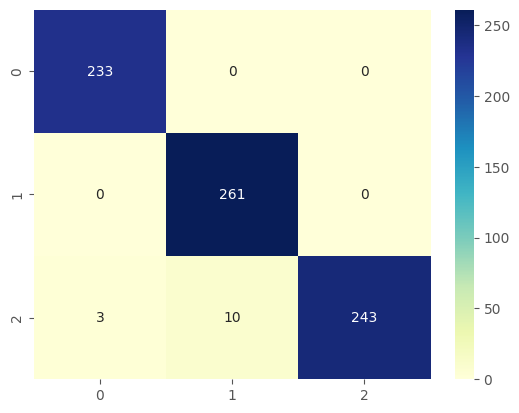

In [ ]:
show_metrics(model)

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Отчёт классификации:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       233
           1       0.98      0.98      0.98       261
           2       0.98      0.97      0.97       256

    accuracy                           0.98       750
   macro avg       0.98      0.98      0.98       750
weighted avg       0.98      0.98      0.98       750




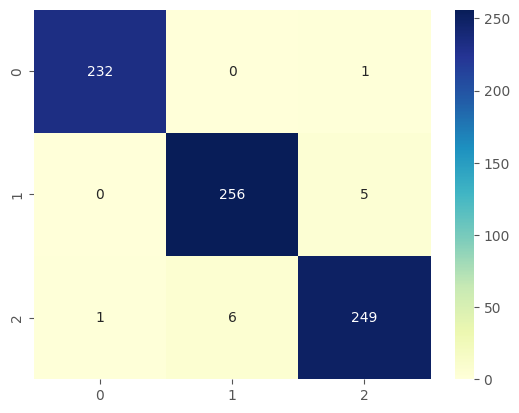

In [ ]:
show_metrics(model_3_1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
Отчёт классификации:

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       233
           1       0.99      0.98      0.99       261
           2       0.98      0.98      0.98       256

    accuracy                           0.99       750
   macro avg       0.99      0.99      0.99       750
weighted avg       0.99      0.99      0.99       750




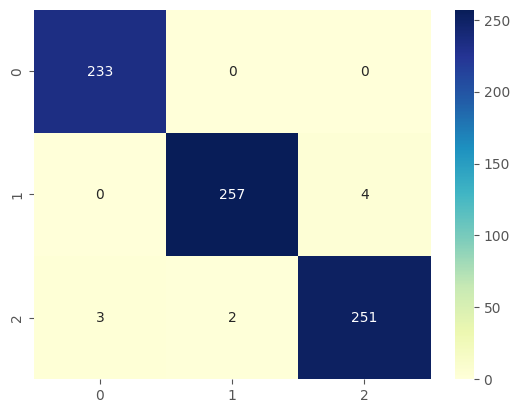

In [ ]:
show_metrics(model_3_2)

In [ ]:
def visualize_act_map_by_class(model, X_test, y_test, class_names, n_classes=3):
    """
    Функция для визуализации карт активаций для каждого класса CIFAR-100.

    Args:
        model: Обученная модель Keras
        X_test: Массив тестовых изображений CIFAR-100
        y_test: Массив меток для тестовых изображений CIFAR-100
        class_names: Список имён классов CIFAR-100
        n_classes: Количество классов для визуализации

    Returns:
        None. Визуализирует активации интересующих слоев для каждого класса.
    """
    # Собираем только слои Conv2D и MaxPooling2D
    layer_outputs = [
        layer.output
        for layer in model.layers
        if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.MaxPooling2D))
    ]
    activation_model = Model(inputs=model.input, outputs=layer_outputs)

    # Получаем изображения для каждого класса
    for class_idx in range(n_classes):
        # Выбираем все изображения для данного класса
        class_images = X_test[y_test.argmax(axis=1) == class_idx]

        # Если есть хотя бы одно изображение для этого класса
        if len(class_images) > 0:
            # Берём первое изображение данного класса для активаций
            img = np.expand_dims(class_images[0], axis=0)  # Сначала добавляем размерность для батча
            activations = activation_model.predict(img)

            # Визуализируем карты активации для каждого слоя
            for layer_activation, layer in zip(activations, activation_model.layers[1:]):  # пропускаем первый слой
                n_features = layer_activation.shape[-1]
                size = layer_activation.shape[1]
                n_cols = n_features // 16 + int(n_features % 16 > 0)
                display_grid = np.zeros((size * n_cols, size * 16))

                for col in range(n_cols):
                    for row in range(16):
                        if col * 16 + row < n_features:
                            channel_image = layer_activation[0, :, :, col * 16 + row]
                            channel_image -= channel_image.mean()

                            # Проверка, чтобы избежать деления на 0
                            if channel_image.std() != 0:
                                channel_image /= channel_image.std()
                            else:
                                channel_image += 1e-10  # Добавляем маленькое значение

                            channel_image *= 64
                            channel_image += 128
                            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

                # Визуализация
                scale = 1. / size
                fig, ax = plt.subplots(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
                ax.set_title(f'{class_names[class_idx]} - {layer.name}')
                ax.grid(False)
                ax.imshow(display_grid, aspect='auto', cmap='viridis')

                # Границы между плитками
                for i in range(1, n_cols):
                    ax.axhline(y=i * size - 0.5, color='white', linewidth=2)
                for i in range(1, 16):
                    ax.axvline(x=i * size - 0.5, color='white', linewidth=2)

                plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


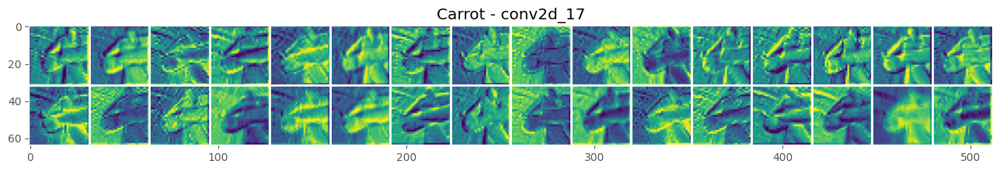

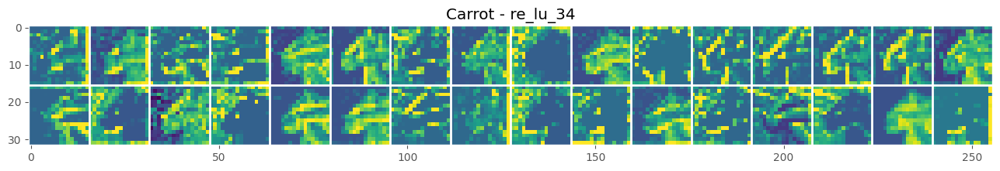

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


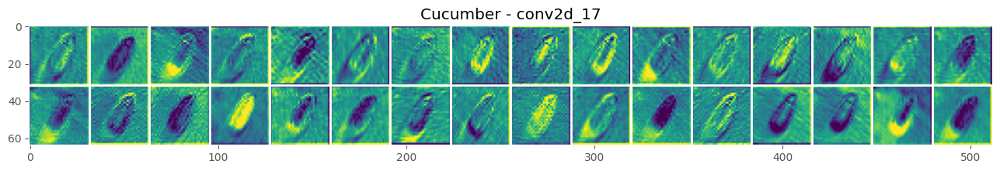

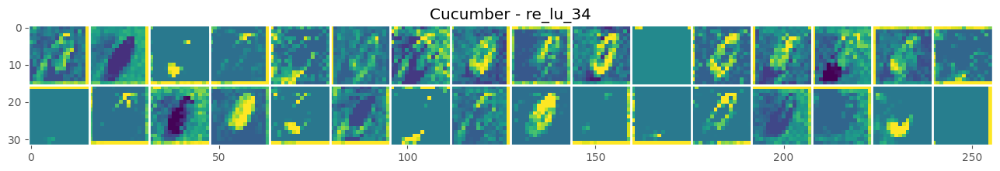

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


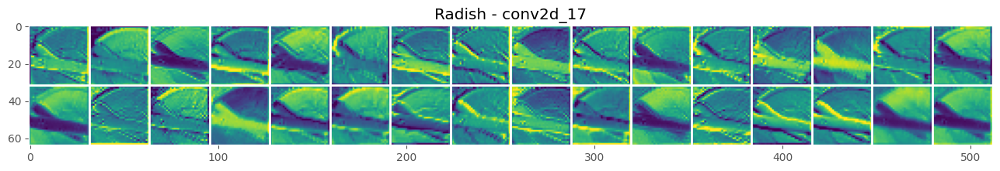

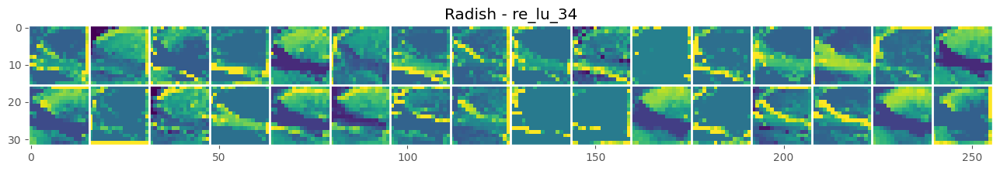

In [ ]:
class_names = ['Carrot', 'Cucumber', 'Radish']

visualize_act_map_by_class(model, X_test, y_test, class_names, n_classes=3)